# About the Project


In this project, I aimed to predict house prices in London using a dataset containing information about boroughs, wards, monthly housing prices, and yearly statistics. After preparing the data by handling missing values and encoding categorical variables, I conducted a thorough analysis of the data. I visualized trends over time, relationships between variables, and insights regarding house prices and crime rates across different boroughs.


# Import the Neccessary Libraries

In [810]:
import re
from scipy.stats import zscore
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score ,mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import mean_absolute_error, mean_squared_error
from fancyimpute import KNN
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.model_selection import train_test_split
import missingno as msno
import statsmodels.api as sm
import string
from prophet import Prophet
from shapely.geometry import Point
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
import geopandas as gpd
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from pylab import rcParams
rcParams['figure.figsize'] = 15, 12

# Allows to display all of the outputs of a cell
from IPython.display import display

# Set float data type format
pd.options.display.float_format = '{:,.2f}'.format

# Set the maximum number of row to be displayed
pd.options.display.max_rows = 999

# Set global visualisation settings
plt.rc('font', size=14)   

# Data Prepration and Analysis

## Load and Preview Data: 
Load the datasets and take a quick look at the first few rows to understand the structure.

In [811]:
# Load the datasets
yearly_df = pd.read_csv(r'C:\Users\Joben\Desktop\MSc Real World Applications\New data\housing_in_london_yearly_variables.csv')
monthly_df = pd.read_csv(r'C:\Users\Joben\Desktop\MSc Real World Applications\New data\housing_in_london_monthly_variables.csv')

# Load the non-spatial attribute data for analysis
boroughs = gpd.read_file(r'C:\Users\Joben\Desktop\MSc Real World Applications\New data\london_wards\London_Wards\Boroughs\London_Borough_Excluding_MHW.shp')
wards = gpd.read_file(r'C:\Users\Joben\Desktop\MSc Real World Applications\New data\london_wards\London_Wards\Wards\London_Ward_CityMerged.shp')

In [812]:
# Display the first few rows of each dataset
print("housing_in_london_monthly_variables Dataset:")
display(monthly_df.head())
print("\nhousing_in_london_yearly_variables Dataset:")
display(yearly_df.head())

housing_in_london_monthly_variables Dataset:


,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag
0,1995-01-01,city of london,91449,E09000001,17.00,NaN,1
1,1995-02-01,city of london,82203,E09000001,7.00,NaN,1
2,1995-03-01,city of london,79121,E09000001,14.00,NaN,1
3,1995-04-01,city of london,77101,E09000001,7.00,NaN,1
4,1995-05-01,city of london,84409,E09000001,10.00,NaN,1



housing_in_london_yearly_variables Dataset:


,code,area,date,median_salary,life_satisfaction,mean_salary,recycling_pct,population_size,number_of_jobs,area_size,no_of_houses,borough_flag
0,E09000001,city of london,1999-12-01,"33,020.00",NaN,48922,0,"6,581.00",NaN,NaN,NaN,1
1,E09000002,barking and dagenham,1999-12-01,"21,480.00",NaN,23620,3,"162,444.00",NaN,NaN,NaN,1
2,E09000003,barnet,1999-12-01,"19,568.00",NaN,23128,8,"313,469.00",NaN,NaN,NaN,1
3,E09000004,bexley,1999-12-01,"18,621.00",NaN,21386,18,"217,458.00",NaN,NaN,NaN,1
4,E09000005,brent,1999-12-01,"18,532.00",NaN,20911,6,"260,317.00",NaN,NaN,NaN,1


In [813]:
# view the first five rows of the boroughs non spartial attributes
boroughs.head(5)

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,"3,726.12",0.00,F,NaN,NaN,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,E09000008,"8,649.44",0.00,F,NaN,NaN,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,E09000006,"15,013.49",0.00,F,NaN,NaN,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,E09000018,"5,658.54",60.76,F,NaN,NaN,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,E09000009,"5,554.43",0.00,F,NaN,NaN,"POLYGON ((510253.500 182881.600, 510249.900 18..."


In [814]:
# view the first five rows of the wards non spartial attributes
wards.head(5)

,NAME,GSS_CODE,HECTARES,NONLD_AREA,LB_GSS_CD,BOROUGH,POLY_ID,geometry
0,Chessington South,E05000405,755.17,0.00,E09000021,Kingston upon Thames,50840,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Tolworth and Hook Rise,E05000414,259.46,0.00,E09000021,Kingston upon Thames,117160,"POLYGON ((517829.600 165447.100, 517837.100 16..."
2,Berrylands,E05000401,145.39,0.00,E09000021,Kingston upon Thames,50449,"POLYGON ((518107.500 167303.400, 518114.300 16..."
3,Alexandra,E05000400,268.51,0.00,E09000021,Kingston upon Thames,50456,"POLYGON ((520480.000 166909.800, 520490.700 16..."
4,Beverley,E05000402,187.82,0.00,E09000021,Kingston upon Thames,117161,"POLYGON ((522071.000 168144.900, 522063.900 16..."


## Summary Statistics: 
Calculate and display summary statistics to get an overview of the data's central tendencies and distributions.

In [815]:
# Summary statistics for monthly_df
print("Summary Statistics for Monthly Dataset:")
display(monthly_df.describe())

# Summary statistics for yearly_df
print("\nSummary Statistics for Yearly Dataset:")
display(yearly_df.describe())

# Summary statistics for boroughs non spartial attribute
print("\nSummary Statistics for London Borough:")
display(boroughs.describe())

# Summary statistics for wards non spartial attributes
print("\nSummary Statistics for London wards:")
display(wards.describe())

Summary Statistics for Monthly Dataset:


,average_price,houses_sold,no_of_crimes,borough_flag
count,"13,549.00","13,455.00","7,439.00","13,549.00"
mean,"263,519.68","3,893.99","2,158.35",0.73
std,"187,617.50","12,114.40",902.09,0.44
min,"40,722.00",2.00,0.00,0.00
25%,"132,380.00",247.00,"1,623.00",0.00
50%,"222,919.00",371.00,"2,132.00",1.00
75%,"336,843.00","3,146.00","2,582.00",1.00
max,"1,463,378.00","132,163.00","7,461.00",1.00



Summary Statistics for Yearly Dataset:


,median_salary,life_satisfaction,population_size,number_of_jobs,area_size,no_of_houses,borough_flag
count,"1,049.00",352.00,"1,018.00",931.00,666.00,666.00,"1,071.00"
mean,"27,977.79",7.49,"6,042,576.49","3,188,094.52","372,490.27","881,468.15",0.65
std,"6,412.81",0.20,"15,268,096.56","8,058,302.24","2,157,060.24","3,690,376.14",0.48
min,"15,684.00",7.00,"6,581.00","47,000.00",315.00,"5,009.00",0.00
25%,"23,857.00",7.35,"224,345.75","94,500.00","2,960.00","87,635.50",0.00
50%,"27,441.00",7.51,"294,603.50","157,000.00","4,323.00","102,402.00",1.00
75%,"30,932.00",7.64,"4,630,098.50","2,217,000.00","8,220.00","126,276.00",1.00
max,"61,636.00",7.96,"66,435,550.00","35,750,000.00","13,303,728.00","24,172,166.00",1.00



Summary Statistics for London Borough:


,HECTARES,NONLD_AREA,SUB_2009,SUB_2006
count,33.00,33.00,0.00,0.00
mean,"4,832.42",64.22,NaN,NaN
std,"3,277.03",99.07,NaN,NaN
min,314.94,0.00,NaN,NaN
25%,"2,724.94",0.00,NaN,NaN
50%,"3,857.81",2.30,NaN,NaN
75%,"5,658.54",95.60,NaN,NaN
max,"15,013.49",370.62,NaN,NaN



Summary Statistics for London wards:


,HECTARES,NONLD_AREA,POLY_ID
count,625.00,625.00,625.00
mean,255.15,3.39,"84,914.57"
std,258.00,15.61,"33,172.21"
min,39.21,0.00,"50,449.00"
25%,123.20,0.00,"50,901.00"
50%,186.61,0.00,"116,701.00"
75%,289.77,0.00,"117,136.00"
max,"2,903.96",154.28,"123,573.00"


In [816]:
print('Boroughs info',boroughs.info(),'\n')
print('Wards info',wards.info(),'\n')
print('Monthly_DF info',monthly_df.info(),'\n')
print('Yearly_DF info',yearly_df.info(),'\n')

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   NAME        33 non-null     object  
 1   GSS_CODE    33 non-null     object  
 2   HECTARES    33 non-null     float64 
 3   NONLD_AREA  33 non-null     float64 
 4   ONS_INNER   33 non-null     object  
 5   SUB_2009    0 non-null      float64 
 6   SUB_2006    0 non-null      float64 
 7   geometry    33 non-null     geometry
dtypes: float64(4), geometry(1), object(3)
memory usage: 2.2+ KB
Boroughs info None 

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 625 entries, 0 to 624
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   NAME        625 non-null    object  
 1   GSS_CODE    625 non-null    object  
 2   HECTARES    625 non-null    float64 
 3   NONLD_AREA  625 non-null    float64 
 4   LB_GSS_CD   625

In [817]:
print('Boroughs Shape',boroughs.shape)
print('Wards Shape',wards.shape)
print('Monthly DF Shape',monthly_df.shape)
print('Yearly_DF Shape',yearly_df.shape)

Boroughs Shape (33, 8)
Wards Shape (625, 8)
Monthly DF Shape (13549, 7)
Yearly_DF Shape (1071, 12)


## Handle Duplicates

In [818]:
# Display duplicates rows for each column in the datasets
print("Borough Duplicates",boroughs[boroughs.duplicated()],'\n')
print("Wards Duplicates",wards[wards.duplicated()],'\n')
print("Monthly DataFrame Duplicates",monthly_df[monthly_df.duplicated()],'\n')
print("Yearly Duplicates DataFrame",yearly_df[yearly_df.duplicated()])

Borough Duplicates Empty GeoDataFrame
Columns: [NAME, GSS_CODE, HECTARES, NONLD_AREA, ONS_INNER, SUB_2009, SUB_2006, geometry]
Index: [] 

Wards Duplicates Empty GeoDataFrame
Columns: [NAME, GSS_CODE, HECTARES, NONLD_AREA, LB_GSS_CD, BOROUGH, POLY_ID, geometry]
Index: [] 

Monthly DataFrame Duplicates Empty DataFrame
Columns: [date, area, average_price, code, houses_sold, no_of_crimes, borough_flag]
Index: [] 

Yearly Duplicates DataFrame Empty DataFrame
Columns: [code, area, date, median_salary, life_satisfaction, mean_salary, recycling_pct, population_size, number_of_jobs, area_size, no_of_houses, borough_flag]
Index: []


In [819]:
# Drop duplicates if any
boroughs = boroughs.drop_duplicates()
monthly_df = monthly_df.drop_duplicates()
yearly_df = yearly_df.drop_duplicates()
wards = wards.drop_duplicates()

## Identify and visualize missing values in the datasets.

In [820]:
print("boroughs Missing Values",boroughs.isna().sum(),'\n')
print("wards Missing Values",wards.isna().sum(),'\n')
print("Monthly DataFrame Missing Values",monthly_df.isna().sum(),'\n')
print("Yearly DataFrame Missing Values",yearly_df.isna().sum(),'\n')

boroughs Missing Values NAME           0
GSS_CODE       0
HECTARES       0
NONLD_AREA     0
ONS_INNER      0
SUB_2009      33
SUB_2006      33
geometry       0
dtype: int64 

wards Missing Values NAME          0
GSS_CODE      0
HECTARES      0
NONLD_AREA    0
LB_GSS_CD     0
BOROUGH       0
POLY_ID       0
geometry      0
dtype: int64 

Monthly DataFrame Missing Values date                0
area                0
average_price       0
code                0
houses_sold        94
no_of_crimes     6110
borough_flag        0
dtype: int64 

Yearly DataFrame Missing Values code                   0
area                   0
date                   0
median_salary         22
life_satisfaction    719
mean_salary            0
recycling_pct        211
population_size       53
number_of_jobs       140
area_size            405
no_of_houses         405
borough_flag           0
dtype: int64 



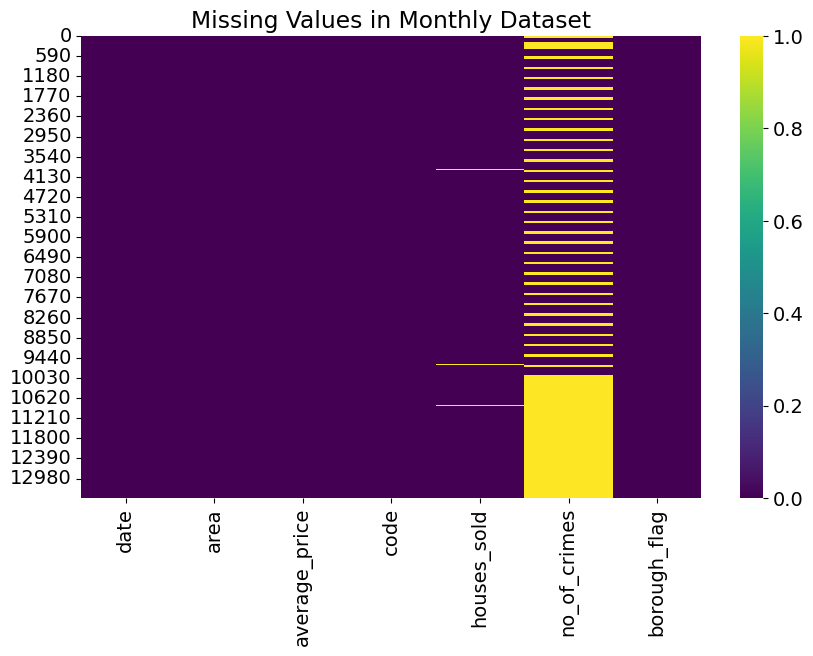

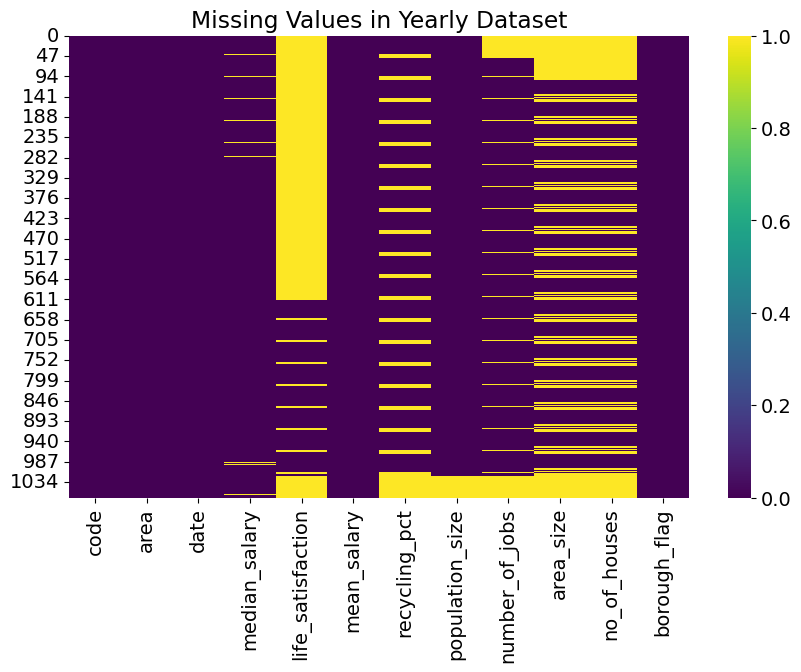

In [821]:
# Visualize missing values in monthly_df
plt.figure(figsize=(10, 6))
sns.heatmap(monthly_df.isnull(), cmap='viridis')
plt.title("Missing Values in Monthly Dataset")
plt.show()

# Visualize missing values in yearly_df
plt.figure(figsize=(10, 6))
sns.heatmap(yearly_df.isnull(), cmap='viridis')
plt.title("Missing Values in Yearly Dataset")
plt.show()

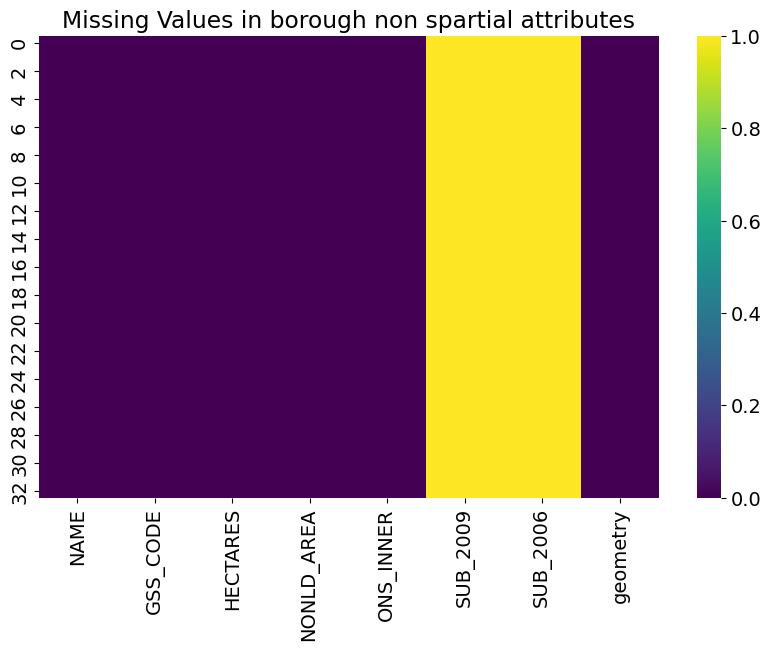

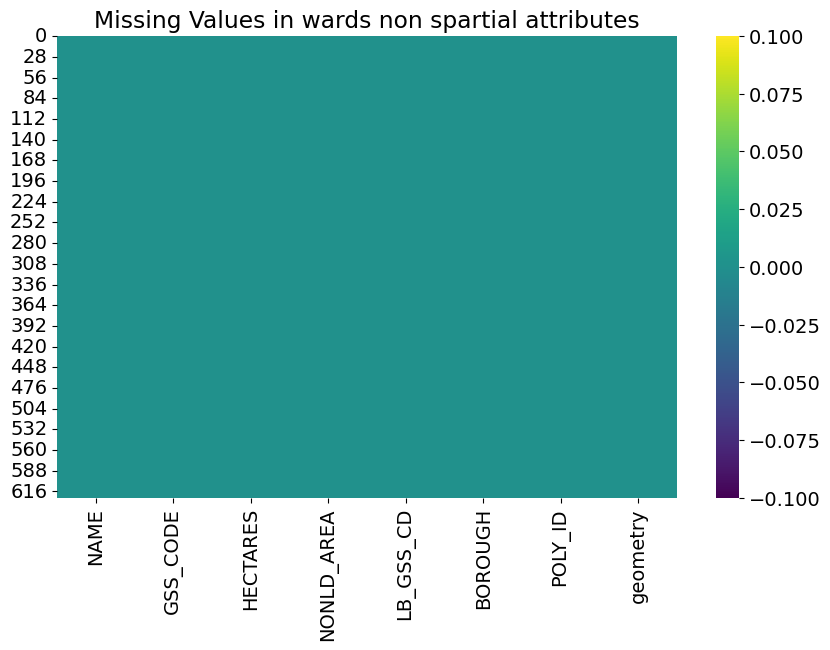

In [822]:
# Visualize missing values in boroughs
plt.figure(figsize=(10, 6))
sns.heatmap(boroughs.isnull(), cmap='viridis')
plt.title("Missing Values in borough non spartial attributes")
plt.show()

# Visualize missing values in boroughs
plt.figure(figsize=(10, 6))
sns.heatmap(wards.isnull(), cmap='viridis')
plt.title("Missing Values in wards non spartial attributes")
plt.show()

<Axes: >

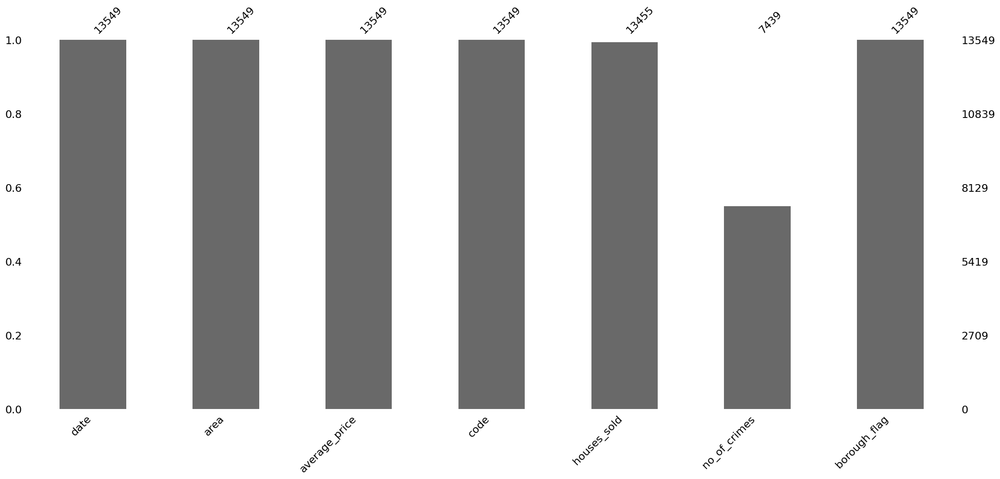

In [823]:
display(msno.bar(monthly_df))

<Axes: >

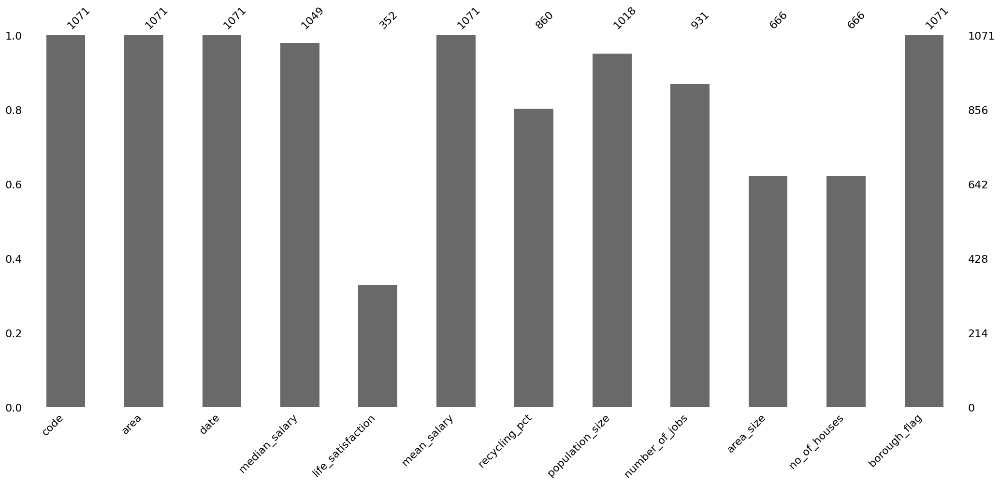

In [824]:
display(msno.bar(yearly_df))

<Axes: >

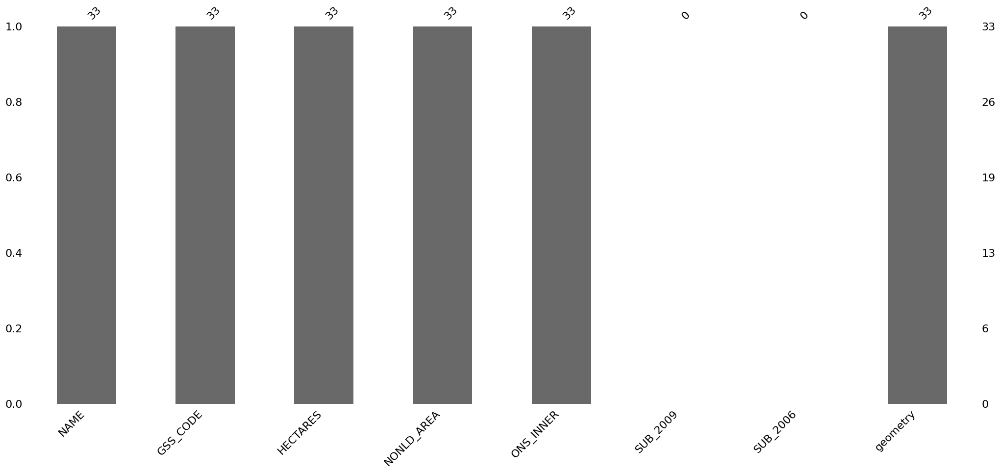

In [825]:
msno.bar(boroughs)

<Axes: >

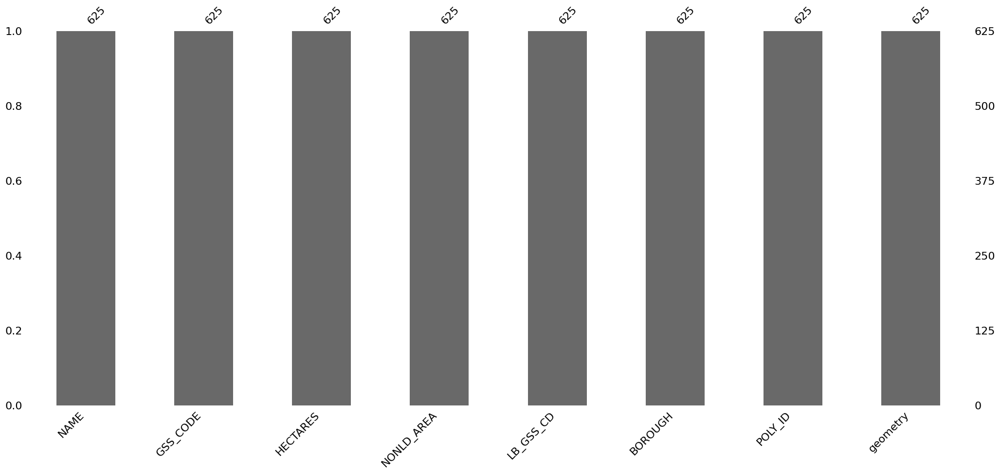

In [826]:
msno.bar(wards)

In [827]:
threshold = 5

# Calculate the percentage to drop
monthly_df_nan_percentage = monthly_df.isna().sum()/len(monthly_df) * 100
yearly_df_nan_percentage = yearly_df.isna().sum()/len(yearly_df) * 100
wards_nan_percentage = wards.isna().sum()/len(wards) * 100
boroughs_nan_pecentage = boroughs.isna().sum()/len(boroughs) * 100

monthly_df_columns_to_drop =  monthly_df_nan_percentage[monthly_df_nan_percentage >= threshold]
yearly_df_columns_to_drop  =  yearly_df_nan_percentage[yearly_df_nan_percentage >= threshold]
wards_columns_to_drop = wards_nan_percentage[wards_nan_percentage >= threshold]
boroughs_columns_to_drop = boroughs_nan_pecentage[boroughs_nan_pecentage >= threshold]
print("Monthly DF Columns to drop:\n",monthly_df_columns_to_drop)
print("Yearly DF columns to drop:\n",yearly_df_columns_to_drop)
print("Wards columns to drop\n",wards_columns_to_drop)
print("borough columns to drop\n",boroughs_columns_to_drop)

Monthly DF Columns to drop:
 no_of_crimes   45.10
dtype: float64
Yearly DF columns to drop:
 life_satisfaction   67.13
recycling_pct       19.70
number_of_jobs      13.07
area_size           37.82
no_of_houses        37.82
dtype: float64
Wards columns to drop
 Series([], dtype: float64)
borough columns to drop
 SUB_2009   100.00
SUB_2006   100.00
dtype: float64


In [828]:
threshold = 20

# Calculate the percentage to drop
monthly_df_nan_percentage = monthly_df.isna().sum()/len(monthly_df) * 100
yearly_df_nan_percentage = yearly_df.isna().sum()/len(yearly_df) * 100
wards_nan_percentage = wards.isna().sum()/len(wards) * 100
boroughs_nan_pecentage = boroughs.isna().sum()/len(boroughs) * 100

monthly_df_columns_to_drop =  monthly_df_nan_percentage[monthly_df_nan_percentage >= threshold].index
yearly_df_columns_to_drop  =  yearly_df_nan_percentage[yearly_df_nan_percentage >= threshold].index
wards_columns_to_drop = wards_nan_percentage[wards_nan_percentage >= threshold].index
boroughs_columns_to_drop = boroughs_nan_pecentage[boroughs_nan_pecentage >= threshold].index
print("Monthly DF Columns to drop:\n",monthly_df_columns_to_drop)
print("Yearly DF columns to drop:\n",yearly_df_columns_to_drop)
print("Wards columns to drop\n",wards_columns_to_drop)
print("borough columns to drop\n",boroughs_columns_to_drop)


Monthly DF Columns to drop:
 Index(['no_of_crimes'], dtype='object')
Yearly DF columns to drop:
 Index(['life_satisfaction', 'area_size', 'no_of_houses'], dtype='object')
Wards columns to drop
 Index([], dtype='object')
borough columns to drop
 Index(['SUB_2009', 'SUB_2006'], dtype='object')


In [829]:
# Drop columns that fall within and above tthreshold
boroughs.drop(columns=['SUB_2009','SUB_2006'],inplace=True)
#yearly_df.drop(columns='life_satisfaction',inplace=True)

#  Distribution Visualization:
Visualize the distribution of numerical variables using histograms or density plots.

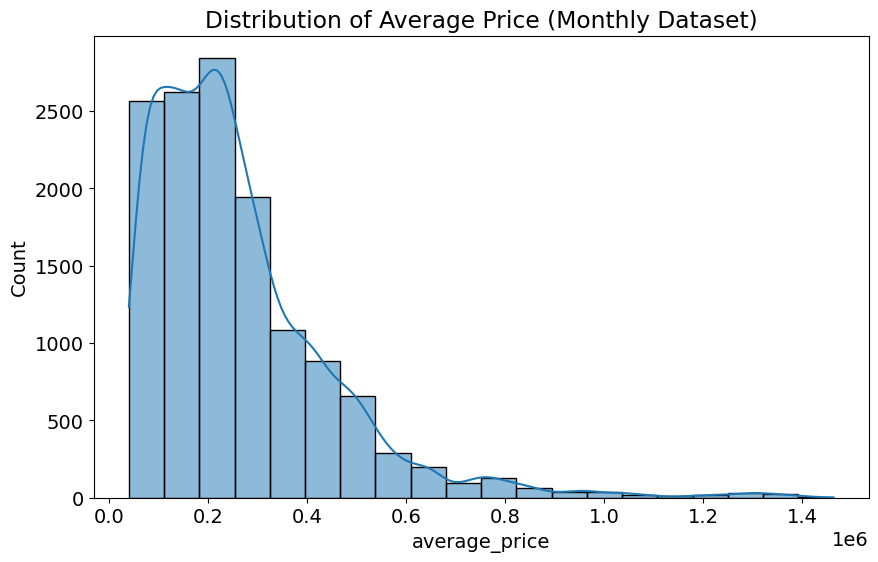

In [591]:
# Histogram of median_salary in monthly_df
plt.figure(figsize=(10, 6))
sns.histplot(data=monthly_df, x='average_price', bins=20, kde=True)
plt.title("Distribution of Average Price (Monthly Dataset)")
plt.show()

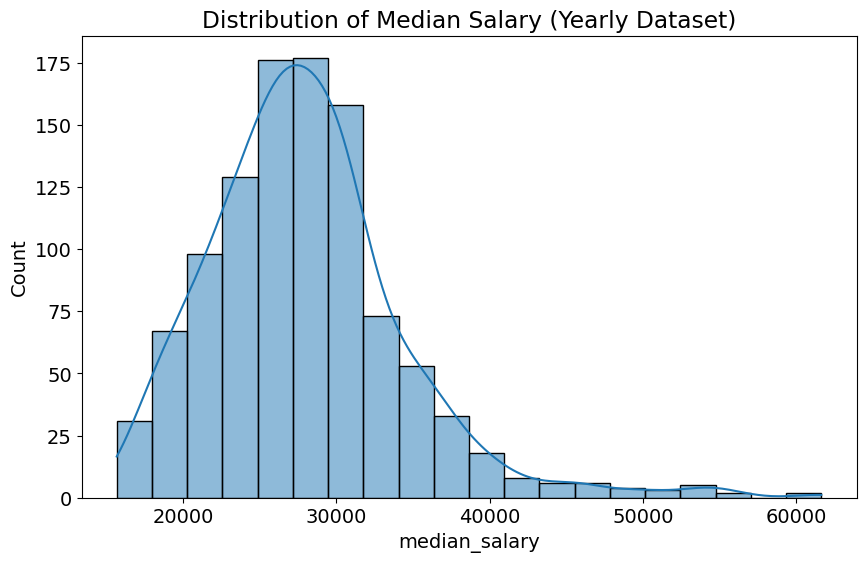

In [592]:
# Histogram of median_salary in monthly_df
plt.figure(figsize=(10, 6))
sns.histplot(data=yearly_df, x='median_salary', bins=20, kde=True)
plt.title("Distribution of Median Salary (Yearly Dataset)")
plt.show()

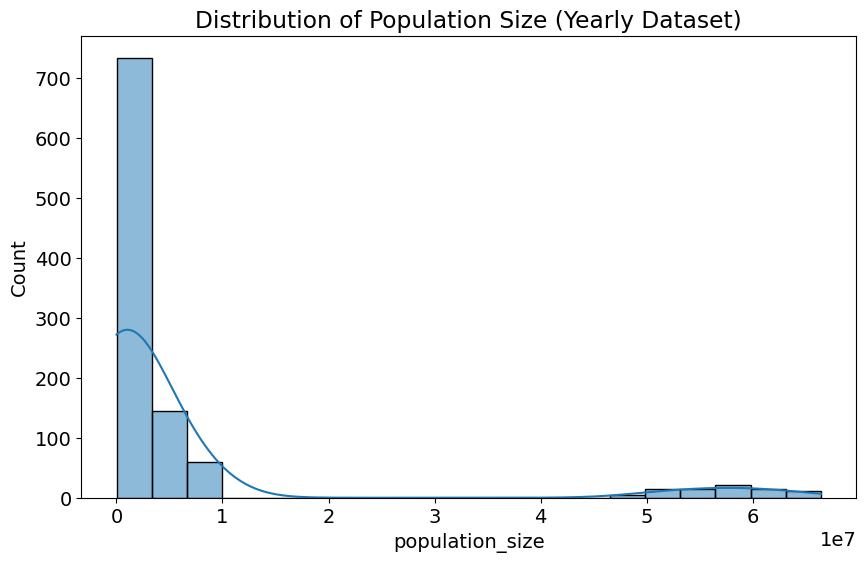

In [24]:
# Histogram of population_size in yearly_df
plt.figure(figsize=(10, 6))
sns.histplot(data=yearly_df, x='population_size', bins=20, kde=True)
plt.title("Distribution of Population Size (Yearly Dataset)")
plt.show()

# 5. Correlation Analysis: 
Analyze the correlation between numerical variables using a correlation matrix or a pair plot.

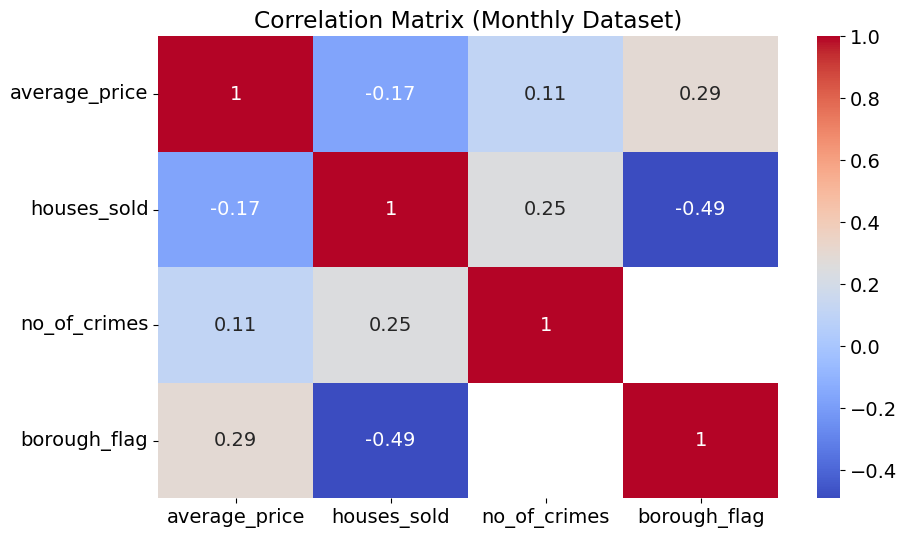

In [25]:
# Correlation matrix for monthly_df
correlation_matrix = monthly_df.drop(columns=['area','date','code']).corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix (Monthly Dataset)")
plt.show()

C:\Users\Joben\anaconda3\envs\TechScholarHub\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


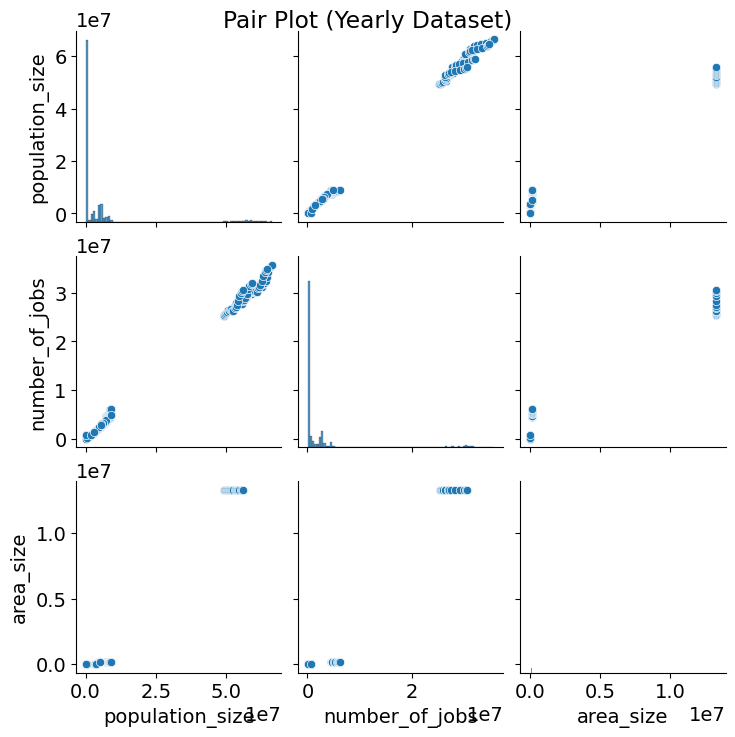

In [26]:
# Pair plot for yearly_df
sns.pairplot(yearly_df, vars=['population_size', 'number_of_jobs', 'area_size'])
plt.suptitle("Pair Plot (Yearly Dataset)")
plt.show()

# Exploratory Data Analysis (EDA) 

## 1. Time Series Analysis:
Since monthly_df contains time-based data, let's perform time series analysis to understand trends and patterns over time.


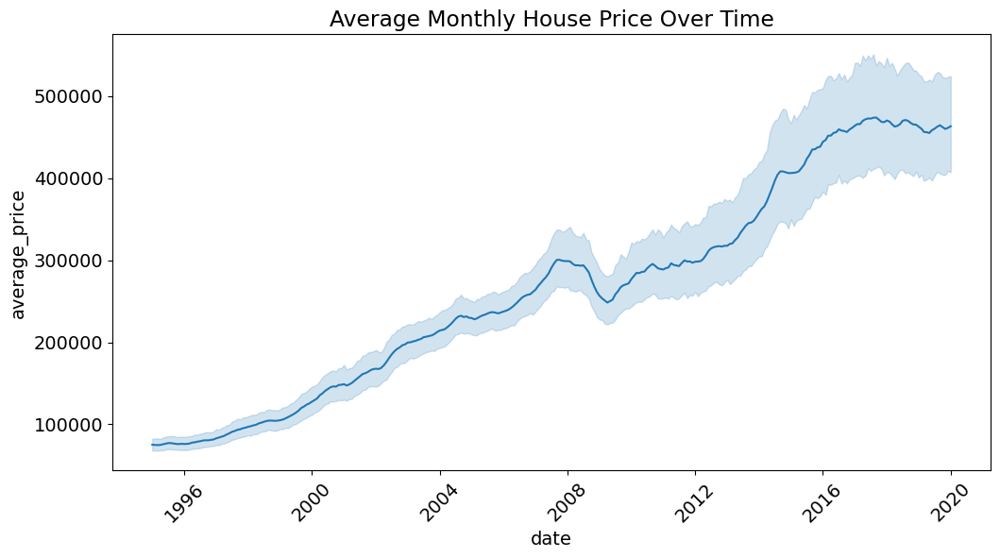

In [27]:
# Convert 'date' column to datetime
monthly_df['date'] = pd.to_datetime(monthly_df['date'])

# Plot median salary over time
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_df, x='date', y='average_price')
plt.title("Average Monthly House Price Over Time")
plt.xticks(rotation=45)
plt.show()

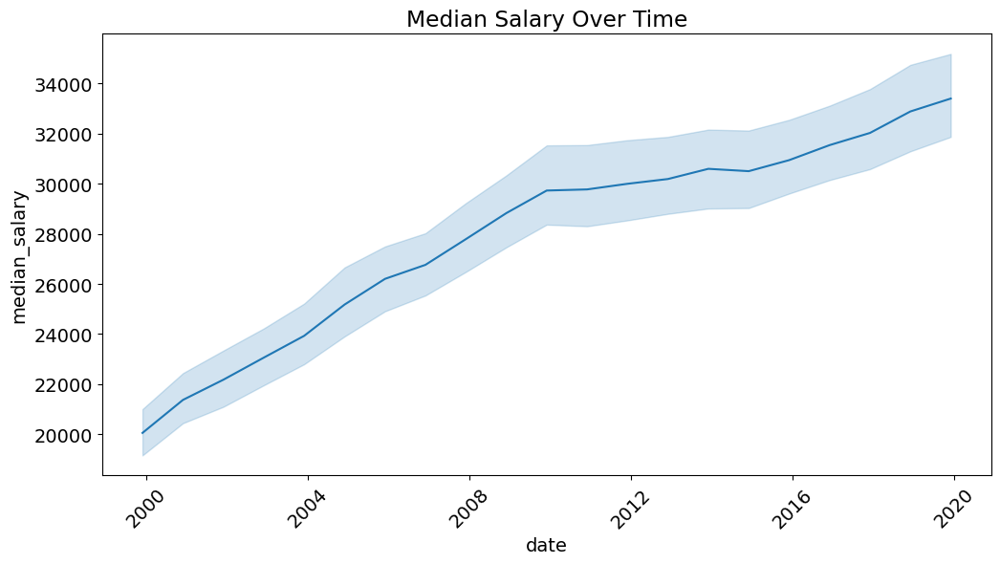

In [28]:
# Convert 'date' column to datetime
yearly_df['date'] = pd.to_datetime(yearly_df['date'])

# Plot median salary over time
plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_df, x='date', y='median_salary')
plt.title("Median Salary Over Time")
plt.xticks(rotation=45)
plt.show()

## 2. Categorical Analysis: 
If monthly_df has categorical data, analyze its distribution and relationships.

In [ ]:
# Histogram of median_salary in monthly_df
plt.figure(figsize=(10, 6))
sns.countplot(data=monthly_df,y='area')
plt.title("Distribution of Area (Monthly Dataset)")
plt.yticks(fontsize=7)
plt.show()

## 3. Box Plots and Outliers:
Identify and visualize outliers using box plots.

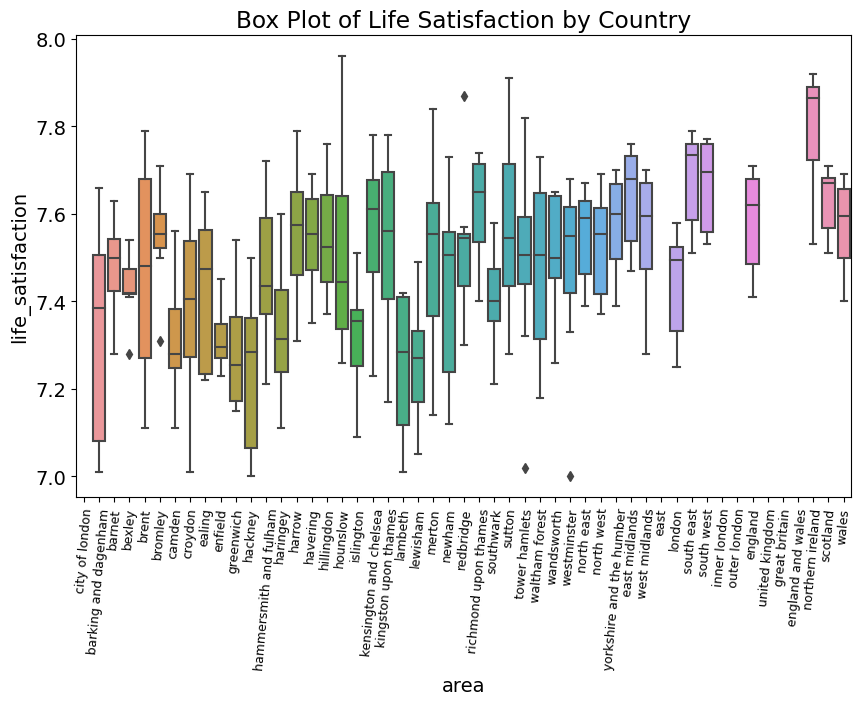

In [29]:
# Box plot of 'life_satisfaction' in yearly_df
plt.figure(figsize=(10, 6))
sns.boxplot(data=yearly_df, x='area', y='life_satisfaction')
plt.title("Box Plot of Life Satisfaction by Country")
plt.xticks(rotation=85,fontsize=9)
plt.show()


## 4. Geographic Visualization: 
If yearly_df contains geographical information, use maps to visualize data spatially.

In [30]:
merged_data = pd.concat([boroughs,wards],axis=0)

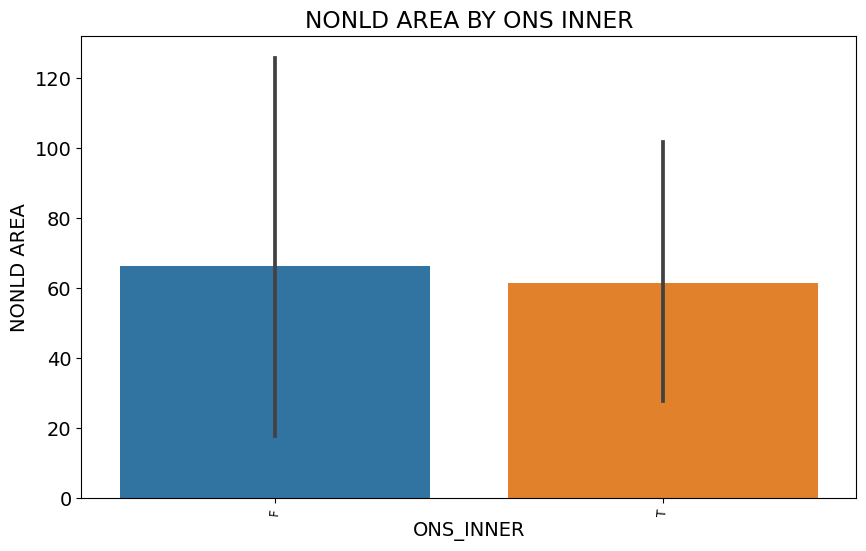

In [31]:
merged_data = pd.concat([boroughs,wards])
#merged_data = wards.merge(boroughs, on='BOROUGH')
# Data Visualization
plt.figure(figsize=(10, 6))
sns.barplot(y='NONLD_AREA', x='ONS_INNER', data=merged_data)
plt.xticks(rotation=85,fontsize=9)
plt.ylabel('NONLD AREA')
plt.title('NONLD AREA BY ONS INNER')
plt.show()

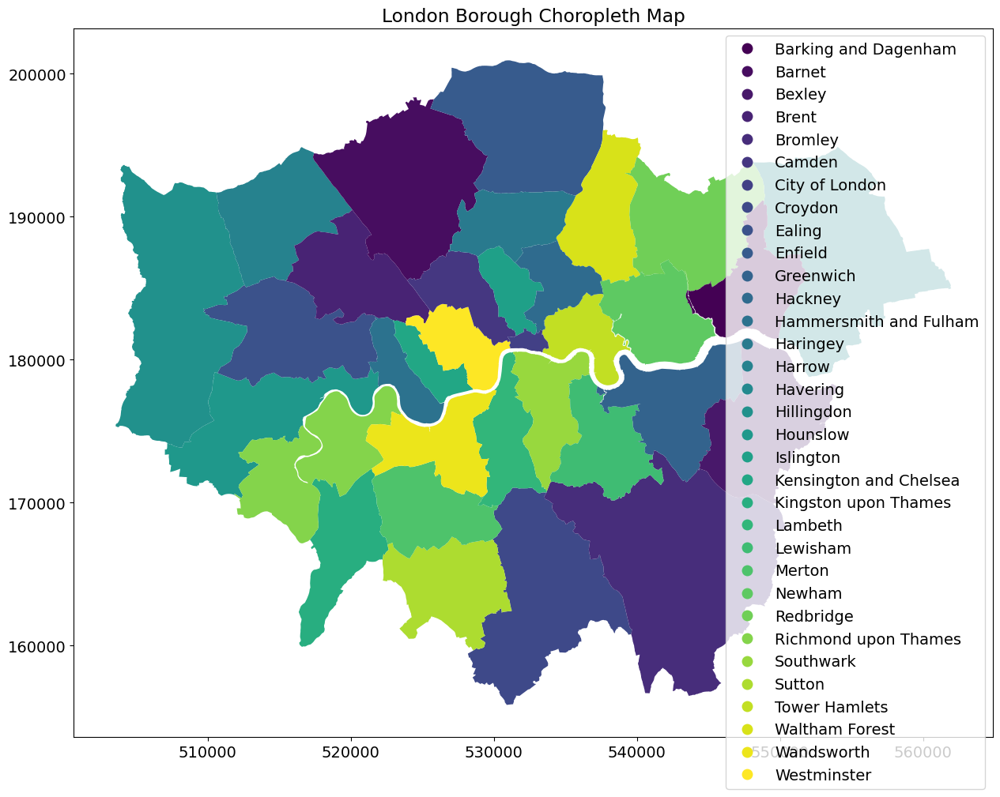

In [32]:
boroughs.plot(column='NAME', cmap='viridis', legend=True)
plt.title('London Borough Choropleth Map')
plt.show()

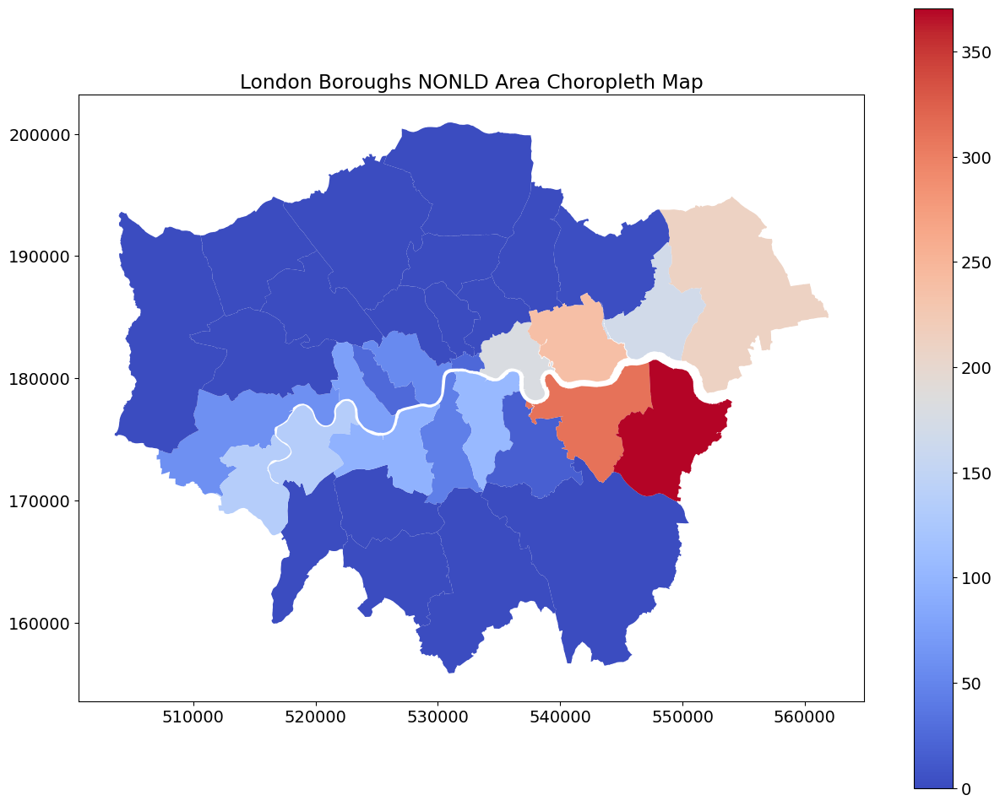

In [33]:
boroughs.plot(column='NONLD_AREA', cmap='coolwarm', legend=True)
plt.title('London Boroughs NONLD Area Choropleth Map')
plt.show()

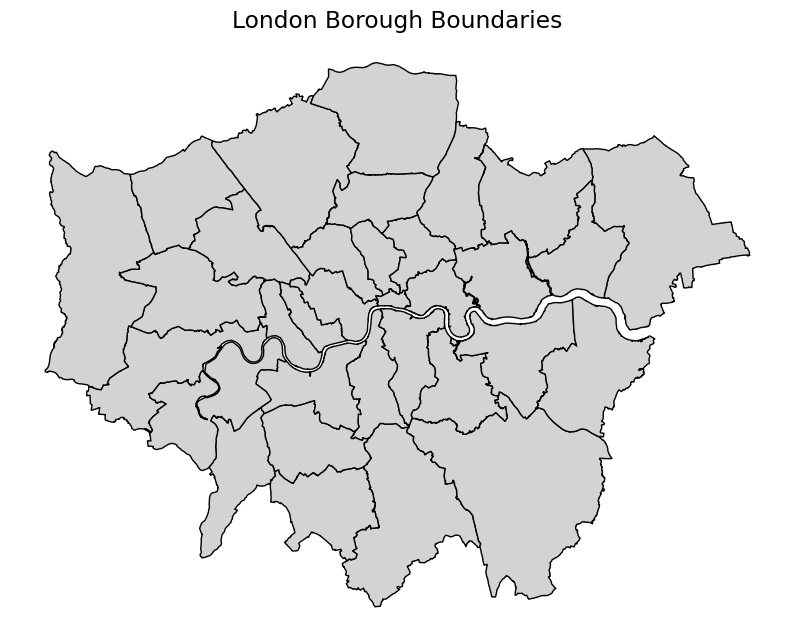

In [34]:
# Plotting the map
fig, ax = plt.subplots(figsize=(10, 10))
boroughs.plot(ax=ax, edgecolor='black', color='lightgray')
ax.set_title("London Borough Boundaries")
plt.axis('off')  # Turn off axis
plt.show()

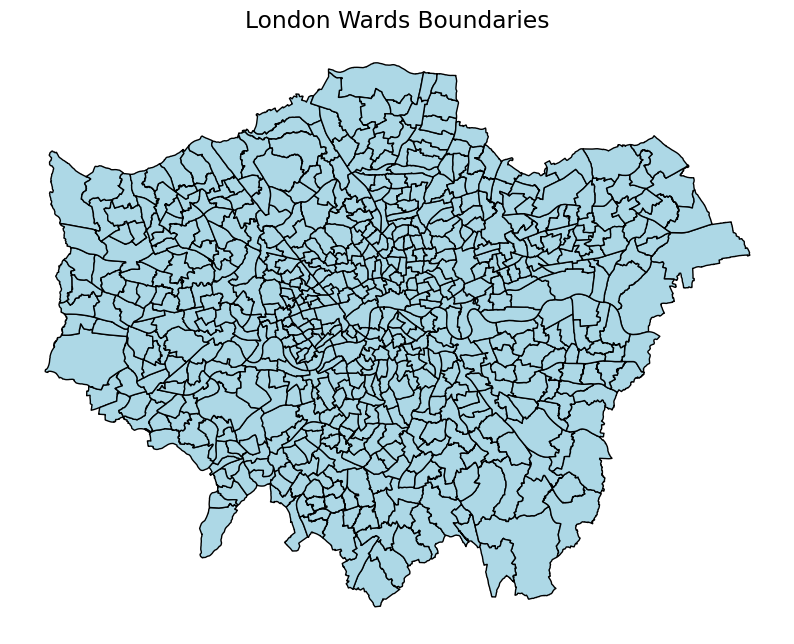

In [35]:
# Plotting the map
fig, ax = plt.subplots(figsize=(10, 10))
wards.plot(ax=ax, edgecolor='black', color='lightblue')
ax.set_title("London Wards Boundaries")
plt.axis('off')  # Turn off axis
plt.show()

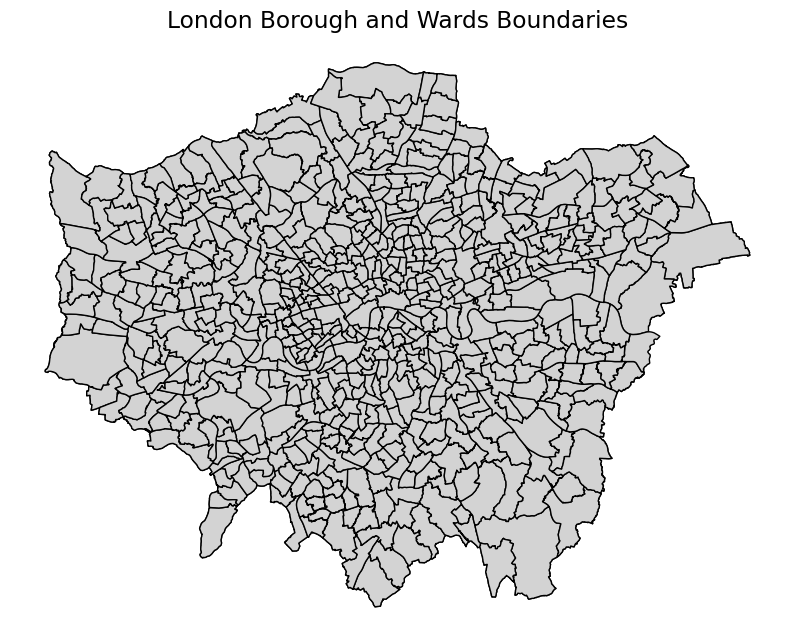

In [36]:
# Plotting the map
fig, ax = plt.subplots(figsize=(10, 10))
merged_data.plot(ax=ax, edgecolor='black', color='lightgray')
ax.set_title("London Borough and Wards Boundaries")
plt.axis('off')  # Turn off axis
plt.show()

In [830]:
import folium

# Create a map centered at London's coordinates
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10)

# Add borough boundaries to the map
for _, row in boroughs.iterrows():
    folium.GeoJson(row['geometry']).add_to(m)

# Display the map
m.save('borough_map.html')
m

# Temporal Analysis - Line Chart:

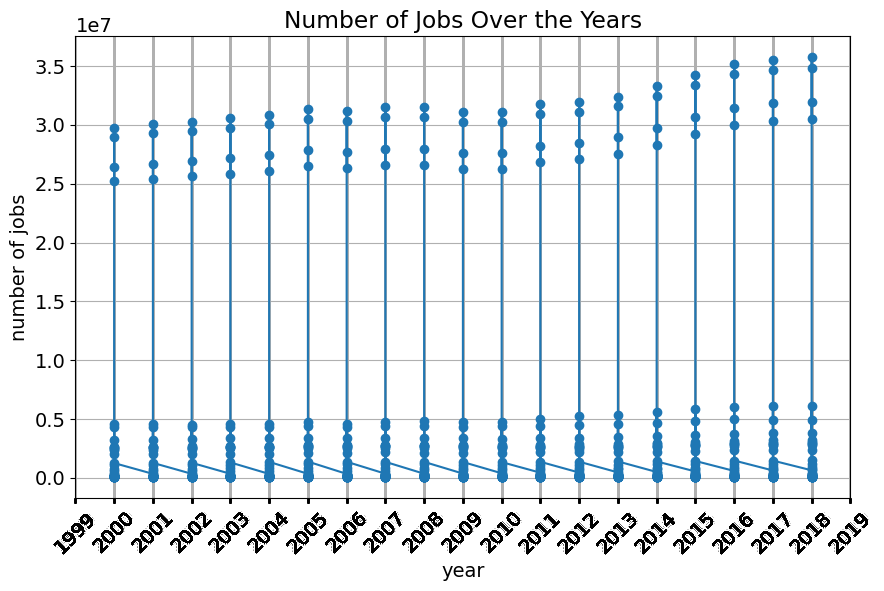

In [30]:
plt.figure(figsize=(10, 6))
plt.plot(yearly_df['date'].dt.year, yearly_df['number_of_jobs'], marker='o')
plt.xlabel('year')
plt.ylabel('number of jobs')
plt.title('Number of Jobs Over the Years')
plt.xticks(yearly_df['date'].dt.year,rotation=45)
plt.grid(True)
plt.show()


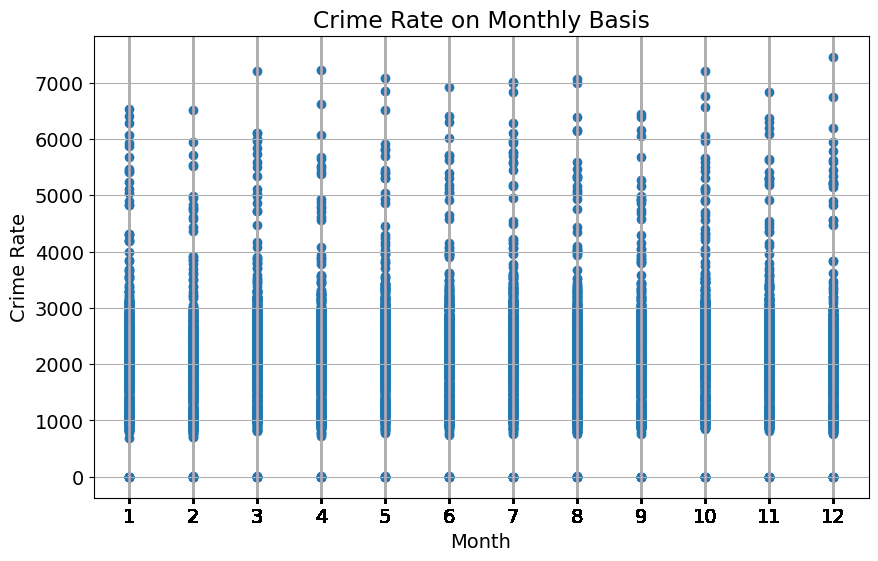

In [39]:
plt.figure(figsize=(10, 6))
plt.scatter(monthly_df['date'].dt.month, monthly_df['no_of_crimes'], marker='o')
plt.xlabel('Month')
plt.ylabel('Crime Rate')
plt.title('Crime Rate on Monthly Basis')
plt.xticks(monthly_df['date'].dt.month)
plt.grid(True)
plt.show()

## Merge the monthly_DF and wards datasets for further analysis 

In [594]:
wards_df = pd.DataFrame(wards)
boroughs_df = pd.DataFrame(boroughs)
wards_df = pd.concat([wards,monthly_df],axis=1)
print(wards_df.shape)
print(wards_df.isnull().sum())

(13549, 15)
NAME             12924
GSS_CODE         12924
HECTARES         12924
NONLD_AREA       12924
LB_GSS_CD        12924
BOROUGH          12924
POLY_ID          12924
geometry         12924
date                 0
area                 0
average_price        0
code                 0
houses_sold         94
no_of_crimes      6110
borough_flag         0
dtype: int64


# Spatial Analysis - Spatial Query:"Local Settings""Adobe Photoshop 2020.lnk"

In [595]:
high_crime_wards = wards_df[wards_df['no_of_crimes'] > 100]
print("Wards with High Crime Rate:\n", high_crime_wards[['NAME', 'no_of_crimes']])

Wards with High Crime Rate:
                 NAME  no_of_crimes
373          Belmont      1,771.00
374          Nonsuch      1,600.00
375   Worcester Park      1,759.00
376     Sutton South      1,643.00
377      Sutton West      1,809.00
...              ...           ...
9933             NaN      6,384.00
9934             NaN      7,208.00
9935             NaN      6,843.00
9936             NaN      7,461.00
9937             NaN      6,405.00

[7328 rows x 2 columns]


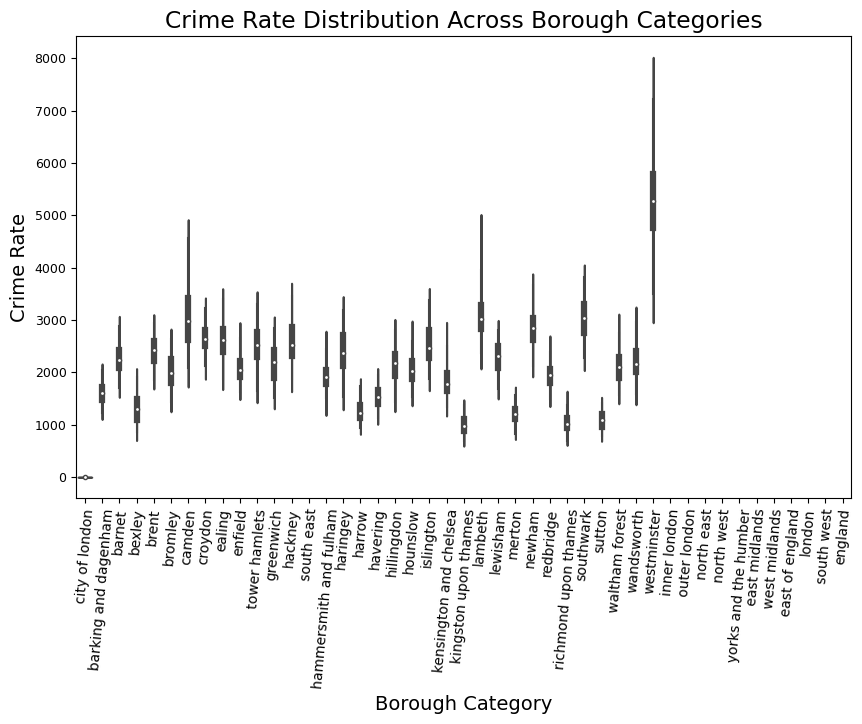

In [596]:
# Create a violin plot to compare crime rates across different borough categories
plt.figure(figsize=(10, 6))
sns.violinplot(x='area', y='no_of_crimes', data=wards_df)
plt.xlabel('Borough Category')
plt.ylabel('Crime Rate')
plt.title('Crime Rate Distribution Across Borough Categories')
plt.xticks(rotation=85, fontsize=10)
plt.yticks(fontsize=9)
plt.show()

# Time Series Analysis - Rolling Average:

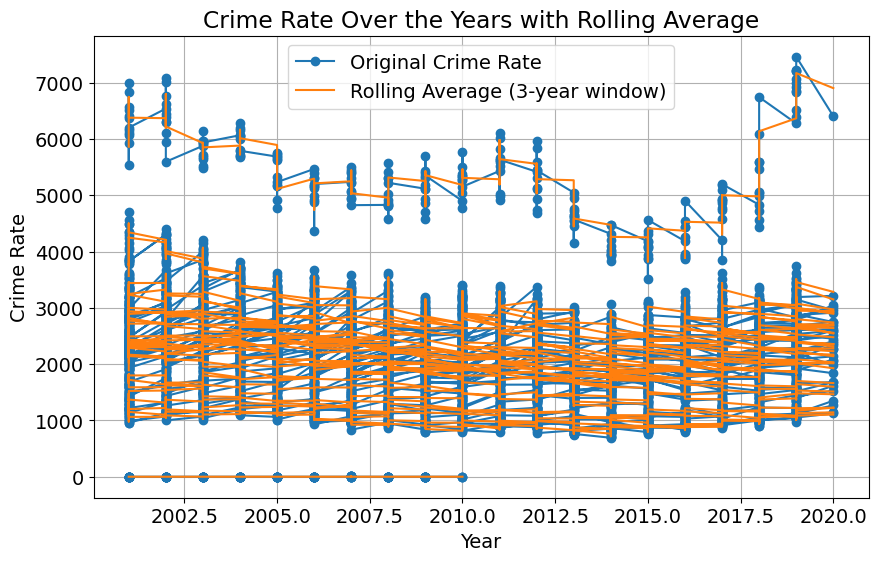

In [833]:
wards_df = pd.concat([wards,monthly_df])
wards_df.date = pd.to_datetime(wards_df.date)
# Calculate rolling average of crime rates over a window
window = 3
wards_df['rolling_avg'] = wards_df['no_of_crimes'].rolling(window=window).mean()

# Plot original crime rates and rolling average
plt.figure(figsize=(10, 6))
plt.plot(wards_df['date'].dt.year, wards_df['no_of_crimes'], label='Original Crime Rate', marker='o')
plt.plot(wards_df['date'].dt.year, wards_df['rolling_avg'], label=f'Rolling Average ({window}-year window)')
plt.xlabel('Year')
plt.ylabel('Crime Rate')
plt.title('Crime Rate Over the Years with Rolling Average')
plt.legend()
plt.grid(True)
plt.show()

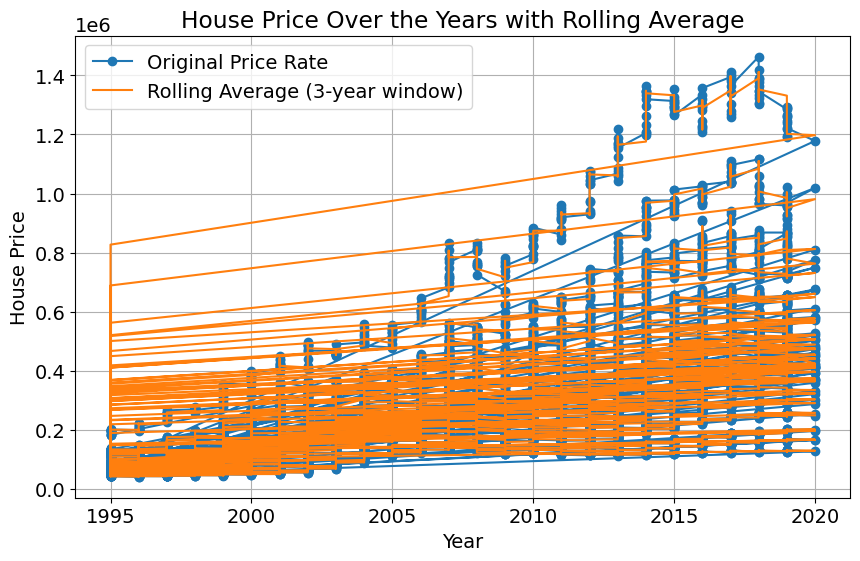

In [834]:
wards_df.date = pd.to_datetime(wards_df.date)
monthly_df.date = pd.to_datetime(monthly_df.date)
# Calculate rolling average of crime rates over a window
window = 3
monthly_df['rolling_avg'] = monthly_df.average_price.rolling(window=window).mean()

# Plot original crime rates and rolling average
plt.figure(figsize=(10, 6))
plt.plot(monthly_df['date'].dt.year, monthly_df['average_price'], label='Original Price Rate', marker='o')
plt.plot(monthly_df['date'].dt.year, monthly_df['rolling_avg'], label=f'Rolling Average ({window}-year window)')
plt.xlabel('Year')
plt.ylabel('House Price')
plt.title('House Price Over the Years with Rolling Average')
plt.legend()
plt.grid(True)
plt.show()

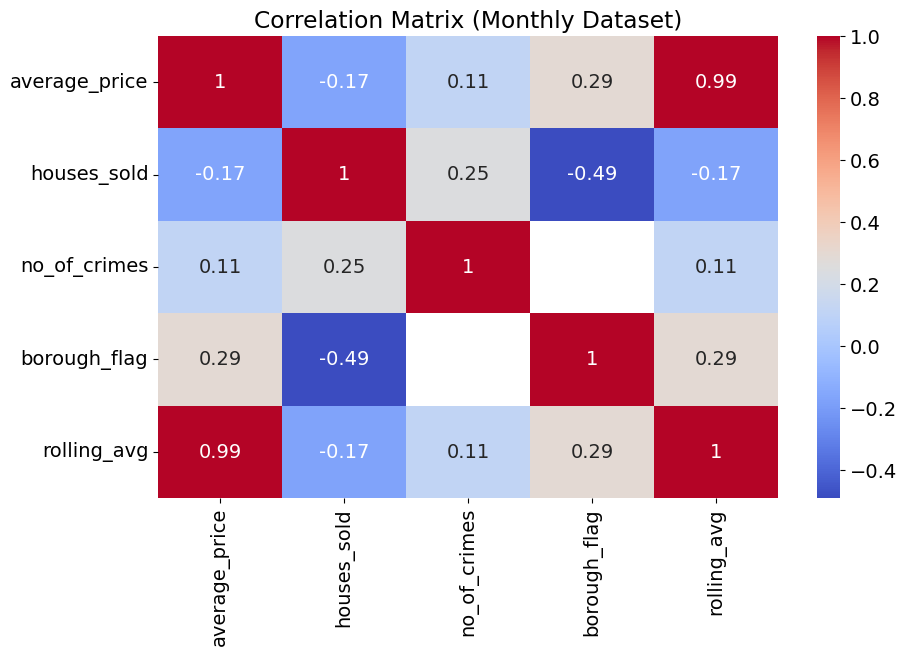

In [835]:
# Correlation matrix for monthly_df
correlation_matrix = monthly_df.drop(columns=['area','date','code']).corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix (Monthly Dataset)")
plt.show()

# Data Cleaning and Preprocessing

In [836]:
# Check if any cell in the dataframe contain a string
contains_strings = yearly_df.applymap(lambda x: isinstance(x, str)).any().any()

# Check if rows contain a string
rows_contains_strings = yearly_df.applymap(lambda x: isinstance(x, str)).any(axis=1).any()

# Check if any column contains a string
columns_contain_strings = yearly_df.applymap(lambda x: isinstance(x,str)).any()

print("Any cell contains a string:", contains_strings)
print("Any row contains a string", rows_contains_strings)
print("Any column contains a string",columns_contain_strings)

Any cell contains a string: True
Any row contains a string True
Any column contains a string code                  True
area                  True
date                  True
median_salary        False
life_satisfaction    False
mean_salary           True
recycling_pct         True
population_size      False
number_of_jobs       False
area_size            False
no_of_houses         False
borough_flag         False
dtype: bool


In [837]:
# Identify the mean salary rows that contains strings
rows_with_string_salary = yearly_df[yearly_df['mean_salary'].apply(lambda x: isinstance(x,str))]
display(rows_with_string_salary)

,code,area,date,median_salary,life_satisfaction,mean_salary,recycling_pct,population_size,number_of_jobs,area_size,no_of_houses,borough_flag
0,E09000001,city of london,1999-12-01,"33,020.00",NaN,48922,0,"6,581.00",NaN,NaN,NaN,1
1,E09000002,barking and dagenham,1999-12-01,"21,480.00",NaN,23620,3,"162,444.00",NaN,NaN,NaN,1
2,E09000003,barnet,1999-12-01,"19,568.00",NaN,23128,8,"313,469.00",NaN,NaN,NaN,1
3,E09000004,bexley,1999-12-01,"18,621.00",NaN,21386,18,"217,458.00",NaN,NaN,NaN,1
4,E09000005,brent,1999-12-01,"18,532.00",NaN,20911,6,"260,317.00",NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1066,K03000001,great britain,2019-12-01,"30,446.00",NaN,37603,NaN,NaN,NaN,NaN,NaN,0
1067,K04000001,england and wales,2019-12-01,"30,500.00",NaN,37865,NaN,NaN,NaN,NaN,NaN,0
1068,N92000002,northern ireland,2019-12-01,"27,434.00",NaN,32083,NaN,NaN,NaN,NaN,NaN,0
1069,S92000003,scotland,2019-12-01,"30,000.00",NaN,34916,NaN,NaN,NaN,NaN,NaN,0


## Data Manipulation

In [838]:
monthly_df.dtypes

date             datetime64[ns]
area                     object
average_price             int64
code                     object
houses_sold             float64
no_of_crimes            float64
borough_flag              int64
rolling_avg             float64
dtype: object

In [839]:
yearly_df.dtypes

code                  object
area                  object
date                  object
median_salary        float64
life_satisfaction    float64
mean_salary           object
recycling_pct         object
population_size      float64
number_of_jobs       float64
area_size            float64
no_of_houses         float64
borough_flag           int64
dtype: object

In [840]:
# convert monthly DataFrame dataypes to the appropriate dtypes
monthly_df.date = pd.to_datetime(monthly_df.date)
monthly_df.average_price = monthly_df.average_price.astype('float64')

monthly_df.houses_sold = monthly_df['houses_sold'].astype('float64')

# convert yearly DataFrame dataypes to the appropriate dtypes
yearly_df['mean_salary'] = yearly_df['mean_salary'].apply(lambda x: float(re.sub(r'[^0-9.]','0', str(x)))).astype('float64')
yearly_df['recycling_pct'] = yearly_df['recycling_pct'].apply(lambda x: float(re.sub(r'[^0-9.]','0', str(x)))).astype('int64')
yearly_df.date = pd.to_datetime(yearly_df.date)

In [841]:
# Display converted dtypes
print('Monthly_df data type',monthly_df.dtypes,'\n')
print('yearly_df data type',yearly_df.dtypes)

Monthly_df data type date             datetime64[ns]
area                     object
average_price           float64
code                     object
houses_sold             float64
no_of_crimes            float64
borough_flag              int64
rolling_avg             float64
dtype: object 

yearly_df data type code                         object
area                         object
date                 datetime64[ns]
median_salary               float64
life_satisfaction           float64
mean_salary                 float64
recycling_pct                 int64
population_size             float64
number_of_jobs              float64
area_size                   float64
no_of_houses                float64
borough_flag                  int64
dtype: object


monthly_df and yearly_df Dataset: For numerical columns, we can use the IterativeImputer from Scikit-learn, which estimates missing values using round-robin regression. For categorical columns, we can use a mode imputation strategy.

## Deal with Missing Values

In [842]:
monthly_df.isnull().sum()

date                0
area                0
average_price       0
code                0
houses_sold        94
no_of_crimes     6110
borough_flag        0
rolling_avg         2
dtype: int64

In [843]:
# Display the updated DataFrame
monthly_df.head(10)

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag,rolling_avg
0,1995-01-01,city of london,"91,449.00",E09000001,17.00,NaN,1,NaN
1,1995-02-01,city of london,"82,203.00",E09000001,7.00,NaN,1,NaN
2,1995-03-01,city of london,"79,121.00",E09000001,14.00,NaN,1,"84,257.67"
3,1995-04-01,city of london,"77,101.00",E09000001,7.00,NaN,1,"79,475.00"
4,1995-05-01,city of london,"84,409.00",E09000001,10.00,NaN,1,"80,210.33"
5,1995-06-01,city of london,"94,901.00",E09000001,17.00,NaN,1,"85,470.33"
6,1995-07-01,city of london,"110,128.00",E09000001,13.00,NaN,1,"96,479.33"
7,1995-08-01,city of london,"112,329.00",E09000001,14.00,NaN,1,"105,786.00"
8,1995-09-01,city of london,"104,473.00",E09000001,17.00,NaN,1,"108,976.67"
9,1995-10-01,city of london,"108,038.00",E09000001,14.00,NaN,1,"108,280.00"


In [844]:
monthly_df.isnull().sum()

date                0
area                0
average_price       0
code                0
houses_sold        94
no_of_crimes     6110
borough_flag        0
rolling_avg         2
dtype: int64

## Check if data are missing by random chance with MCAR: 
p-value => 0.5 suggest a random chance while p-value < 0.5 suggest not a random chance for the missing values

In [845]:
from scipy.stats import chi2_contingency
boroughs_columns = boroughs.columns
monthly_columns = monthly_df.columns
yearly_columns = yearly_df.columns

# Check missing value patterns
boroughs_missing = boroughs[boroughs_columns].isnull()
monthly_missing = monthly_df[monthly_columns].isnull()
yearly_missing = yearly_df[yearly_columns].isnull()

# Check correlation with other variables
boroughs_corr = boroughs_missing.corr()
monthly_corr = monthly_missing.corr()
yearly_corr = yearly_missing.corr()

# Test for MCAR using Chi-squared test
def test_mcar(dataset_missing):
    p_values = []
    for col in dataset_missing.columns:
        contingency_table = pd.crosstab(dataset_missing[col], dataset_missing[col], margins=True)
        chi2, p, _, _ = chi2_contingency(contingency_table)
        p_values.append(p)
    return p_values

boroughs_mcar_p_values = test_mcar(boroughs_missing)
monthly_mcar_p_values = test_mcar(monthly_missing)
yearly_mcar_p_values = test_mcar(yearly_missing)

# Compare summary statistics before and after imputation
# ... Perform imputation

# Analyze impact on analysis or modeling
# ... Evaluate model performance before and after imputation

# Use domain knowledge to assess if imputed values make sense
# ... Compare imputed values with domain expertise

# Print results and observations
print("Boroughs MCAR p-values:", boroughs_mcar_p_values)
print("Monthly MCAR p-values:", monthly_mcar_p_values)
print("Yearly MCAR p-values:", yearly_mcar_p_values)


Boroughs MCAR p-values: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Monthly MCAR p-values: [1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0]
Yearly MCAR p-values: [1.0, 1.0, 1.0, 1.4617552661503381e-230, 1.4617552661503381e-230, 1.0, 1.0, 1.4617552661503381e-230, 1.4617552661503381e-230, 1.4617552661503381e-230, 1.4617552661503381e-230, 1.0]


## Handling Missing Values with Prophet
Forcast missing values with prohet

In [846]:
# Create a dataframe with 'date' and 'no_of_crimes' columns
crimes_data = monthly_df[['date', 'no_of_crimes']].dropna()

# Remove rows with missing values
crimes_data = crimes_data.dropna()

# Rename the column for Prophet compatibility
crimes_data.columns = ['ds', 'y']


# Initialize the Prophet model
model = Prophet()

# Fit the model on the available data
model.fit(crimes_data)

# Create a DataFrame with future dates for forecasting
future_dates = model.make_future_dataframe(periods=6110)

# Make forecasts for the future dates
forecast = model.predict(future_dates)

# Merge forcast values with original data
forecasted_crimes = forecast[['ds','yhat']].rename(columns={'ds':'date','yhat':'forecasted_crimes'})

# Merge the forecasted values with the original data
merged_data = pd.merge(monthly_df, forecasted_crimes, on='date',how='left')

# Replace missing values in 'no_of_crimes' column with forecasted values
monthly_df['no_of_crimes'] = merged_data['no_of_crimes'].fillna(merged_data.forecasted_crimes)

12:22:47 - cmdstanpy - INFO - Chain [1] start processing
12:22:47 - cmdstanpy - INFO - Chain [1] done processing


In [847]:
monthly_df.isna().sum()

date                0
area                0
average_price       0
code                0
houses_sold        94
no_of_crimes     3244
borough_flag        0
rolling_avg         2
dtype: int64

## Forecast the remaining missing values with prophet

In [848]:
# Drop rows with missing values in the 'no_of_crimes' column
monthly_df_cleaned = monthly_df.dropna(subset=['no_of_crimes'])

# Create a new DataFrame with only the 'date' and 'no_of_crimes' columns
data = monthly_df_cleaned[['date', 'no_of_crimes']]

# Rename the columns to 'ds' and 'y' for Prophet
data.columns = ['ds', 'y']

# Initialize and fit the Prophet model
model = Prophet()
model.fit(data)

# Create a DataFrame with all the dates in 'date' column
all_dates = pd.DataFrame({'ds': monthly_df['date']})

# Use the fitted model to predict the 'no_of_crimes' values for all dates
forecast = model.predict(all_dates)

# Fill in the missing values in the original 'monthly_df' DataFrame with the forecasted values
monthly_df['no_of_crimes'] = forecast['yhat']

12:22:53 - cmdstanpy - INFO - Chain [1] start processing
12:22:55 - cmdstanpy - INFO - Chain [1] done processing


In [849]:
# Check if missing values still exist fo the no_of_crimes ccolumns
monthly_df.isna().sum()

date              0
area              0
average_price     0
code              0
houses_sold      94
no_of_crimes      0
borough_flag      0
rolling_avg       2
dtype: int64

### KNN, SimpleImputer and InterativeImputer Methods

In [850]:
# Create a KNN imputer object
knn_imputer = KNN()

# Impute 'houses_sold' column using KNN
monthly_df['houses_sold'] = monthly_df['houses_sold'].fillna(method='ffill').values.reshape(-1,1)
#monthly_df['no_of_crimes'] =  knn_imputer.fit_transform(monthly_df['no_of_crimes'].values.reshape(-1,1))



# Create an imputer object for numerical columns
num_imputer = IterativeImputer(random_state=0)

# Impute numerical columns
numerical_cols = ['median_salary', 'life_satisfaction', 'recycling_pct', 'population_size',
                  'number_of_jobs', 'area_size', 'no_of_houses']
yearly_df[numerical_cols] = num_imputer.fit_transform(yearly_df[numerical_cols])

# Impute categorical column 'borough_flag' with the mode
yearly_df['borough_flag'].fillna(yearly_df['borough_flag'].mode()[0], inplace=True)


In [851]:
monthly_df.rolling_avg =  monthly_df.rolling_avg.fillna(method='bfill')

In [852]:
monthly_df.isna().sum()

date             0
area             0
average_price    0
code             0
houses_sold      0
no_of_crimes     0
borough_flag     0
rolling_avg      0
dtype: int64

# Visualize the Distributions

In [853]:
# Visualize the Distributions

Text(0.5, 1.0, 'Distribution of Median Salaries')

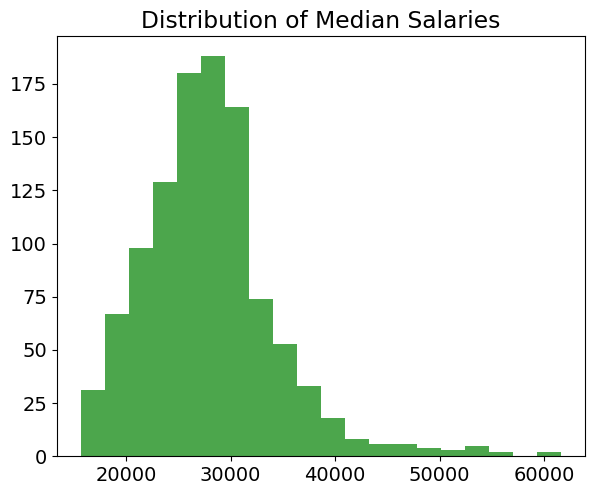

In [854]:
plt.subplot(2, 2, 2)
plt.hist(yearly_df['median_salary'], bins=20, color='green', alpha=0.7)
plt.title('Distribution of Median Salaries')

Text(0.5, 1.0, 'Distribution of No. of Crimes')

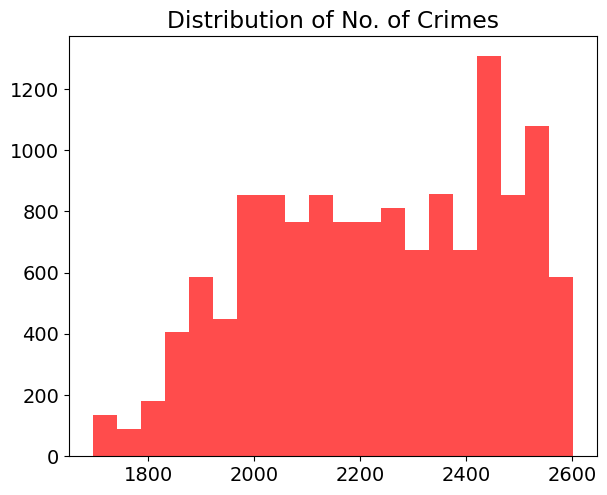

In [855]:
plt.subplot(2, 2, 3)
plt.hist(monthly_df['no_of_crimes'], bins=20, color='red', alpha=0.7)
plt.title('Distribution of No. of Crimes')

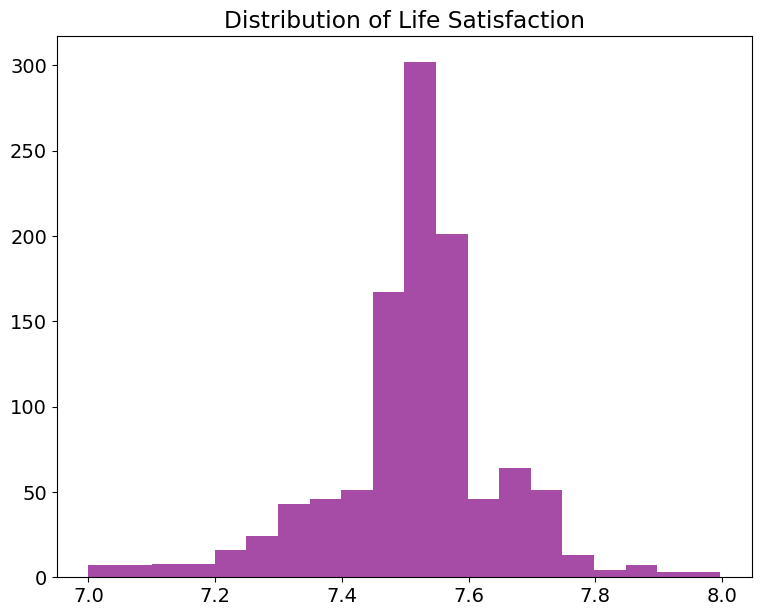

In [856]:

plt.subplot(2, 2, 4)
plt.hist(yearly_df['life_satisfaction'], bins=20, color='purple', alpha=0.7)
plt.title('Distribution of Life Satisfaction')

plt.tight_layout()
plt.show()

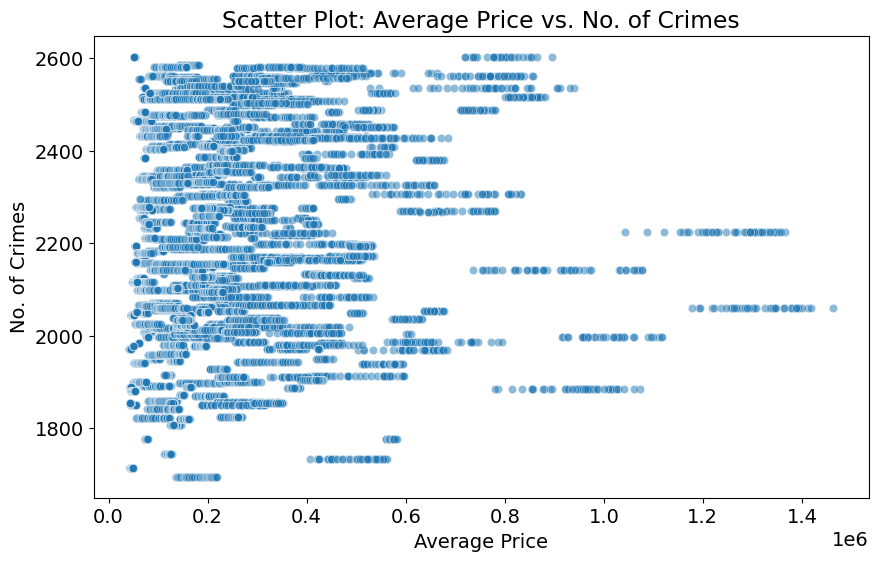

In [857]:
# Explore correlations using scatter plots and correlation matrix
plt.figure(figsize=(10, 6))
sns.scatterplot(data=monthly_df, x='average_price', y='no_of_crimes', alpha=0.5)
plt.title('Scatter Plot: Average Price vs. No. of Crimes')
plt.xlabel('Average Price')
plt.ylabel('No. of Crimes')
plt.show()

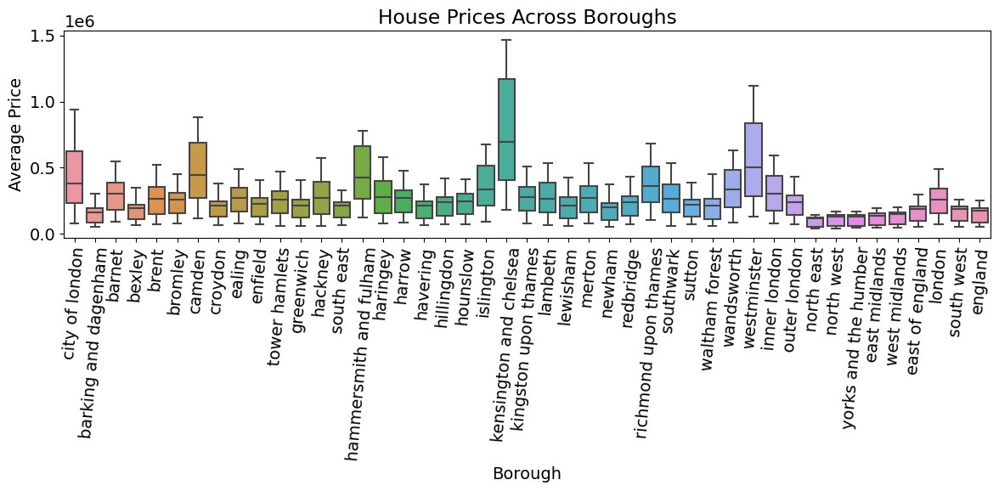

In [858]:
# Compare house prices across boroughs
plt.figure(figsize=(12, 6))
sns.boxplot(data=monthly_df, x='area', y='average_price')
plt.title('House Prices Across Boroughs')
plt.xlabel('Borough')
plt.ylabel('Average Price')
plt.xticks(rotation=85)
plt.tight_layout()
plt.show()

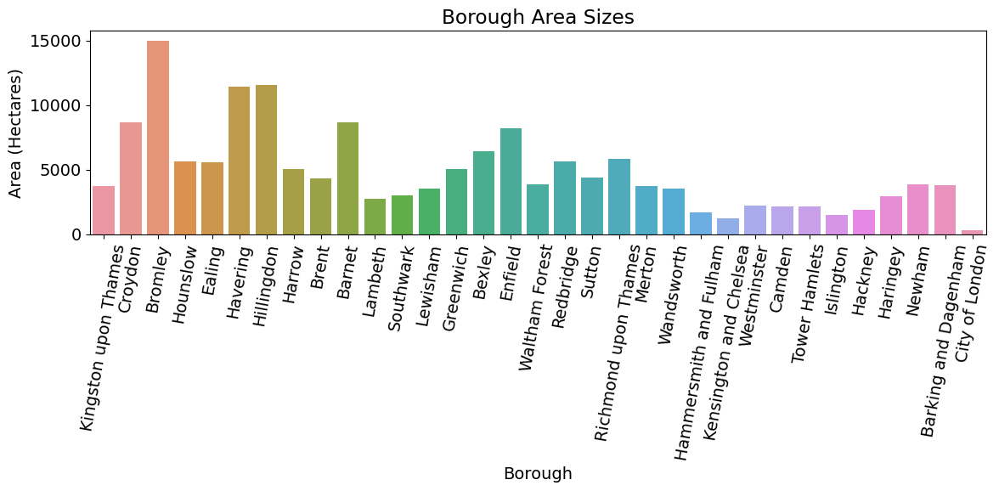

In [859]:

# Create a bar plot of boroughs
plt.figure(figsize=(12, 6))
sns.barplot(data=boroughs, x='NAME', y='HECTARES')
plt.title('Borough Area Sizes')
plt.xlabel('Borough')
plt.ylabel('Area (Hectares)')
plt.xticks(rotation=80)
plt.tight_layout()
plt.show()


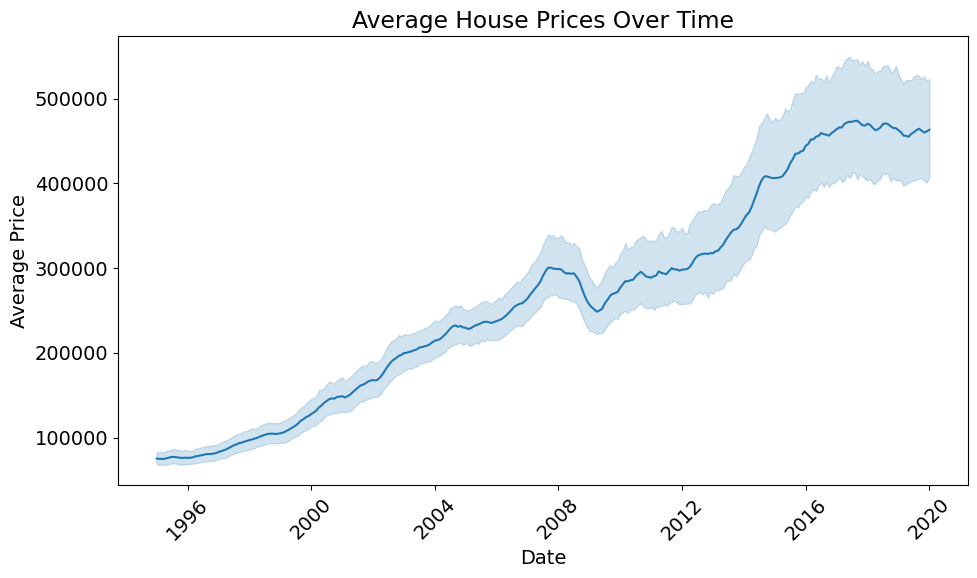

In [860]:
# Time Series Analysis: Average house prices over time
plt.figure(figsize=(10, 6))
sns.lineplot(x='date', y='average_price', data=monthly_df)
plt.title('Average House Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

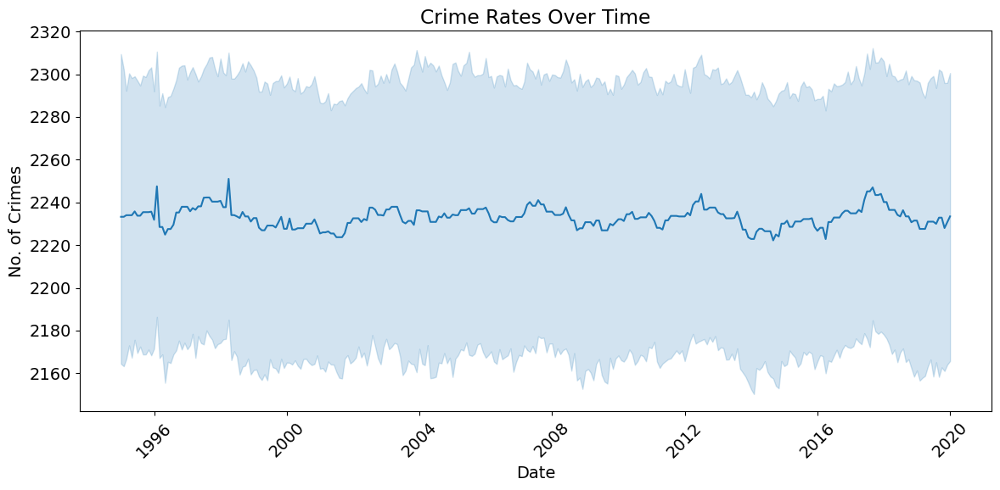

In [861]:
# Visualize crime rates
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_df, x='date', y='no_of_crimes')
plt.title('Crime Rates Over Time')
plt.xlabel('Date')
plt.ylabel('No. of Crimes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

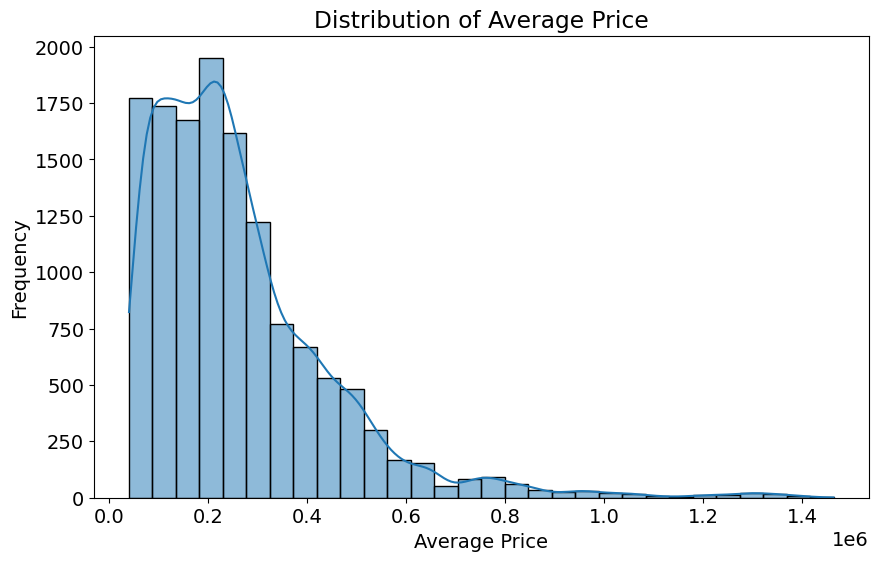

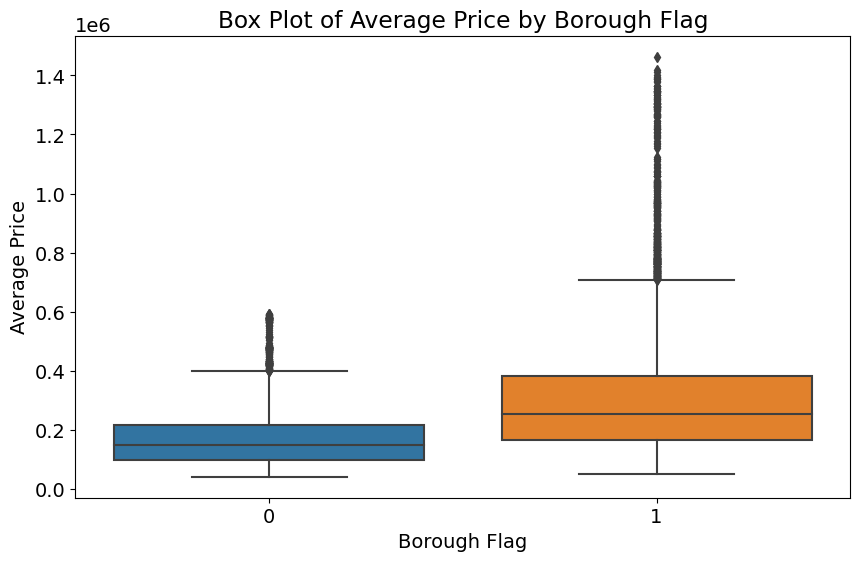

In [862]:
# Create histogram and box plot for average_price
plt.figure(figsize=(10, 6))
sns.histplot(data=monthly_df, x='average_price', bins=30, kde=True)
plt.title('Distribution of Average Price')
plt.xlabel('Average Price')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=monthly_df, x='borough_flag', y='average_price')
plt.title('Box Plot of Average Price by Borough Flag')
plt.xlabel('Borough Flag')
plt.ylabel('Average Price')
plt.show()


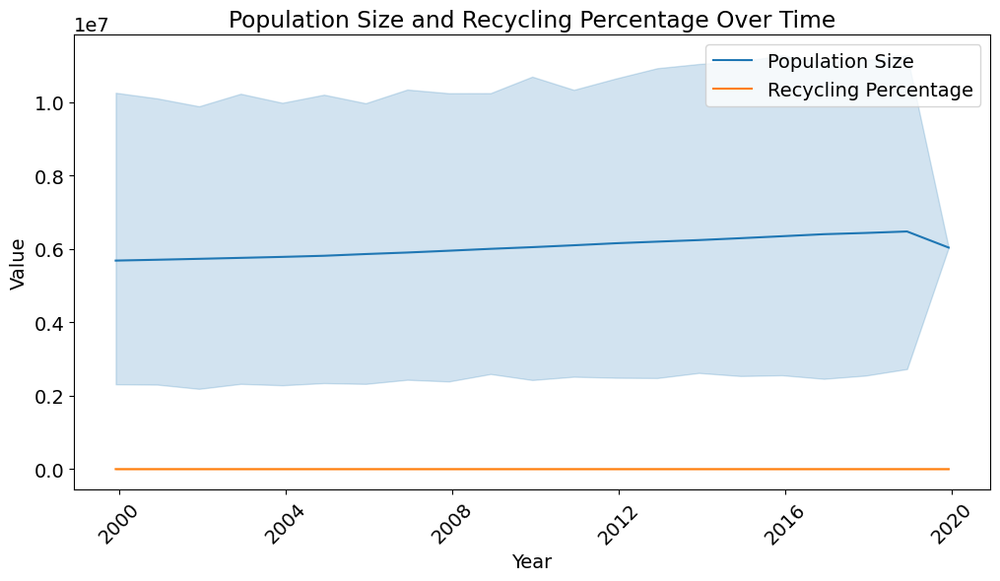

In [863]:
# Identify trends in population size and recycling percentage
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='population_size', data=yearly_df, label='Population Size')
sns.lineplot(x='date', y='recycling_pct', data=yearly_df, label='Recycling Percentage')
plt.title('Population Size and Recycling Percentage Over Time')
plt.xlabel('Year')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.legend()
plt.show()

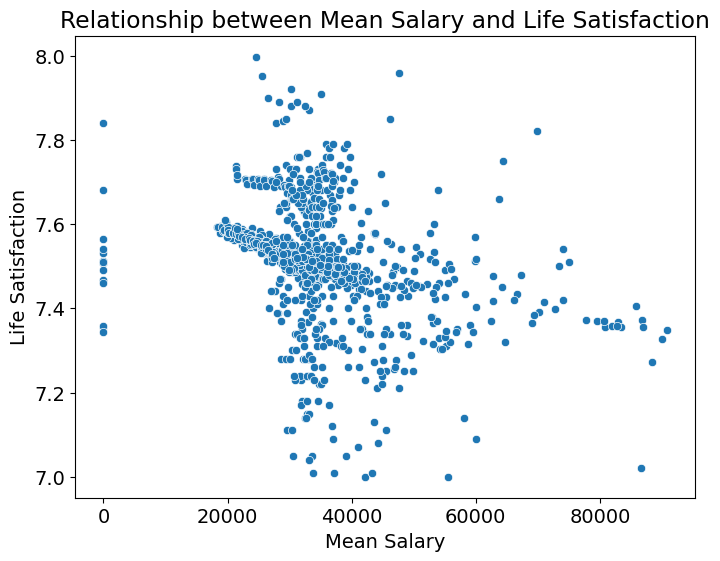

In [630]:
# Explore the relationship between mean salary and life satisfaction
plt.figure(figsize=(8, 6))
sns.scatterplot(x='mean_salary', y='life_satisfaction', data=yearly_df)
plt.title('Relationship between Mean Salary and Life Satisfaction')
plt.xlabel('Mean Salary')
plt.ylabel('Life Satisfaction')
plt.show()


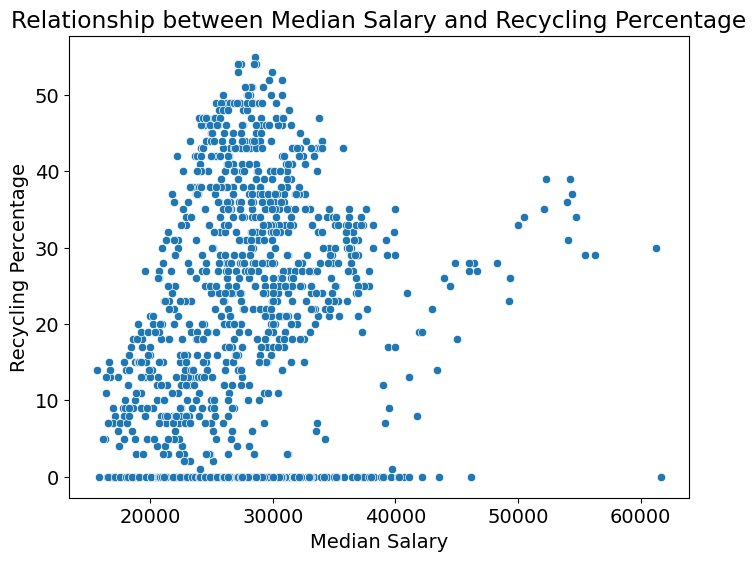

In [631]:
# Visualize the relationship between median salary and recycling percentage
plt.figure(figsize=(8, 6))
sns.scatterplot(x='median_salary', y='recycling_pct', data=yearly_df)
plt.title('Relationship between Median Salary and Recycling Percentage')
plt.xlabel('Median Salary')
plt.ylabel('Recycling Percentage')
plt.show()

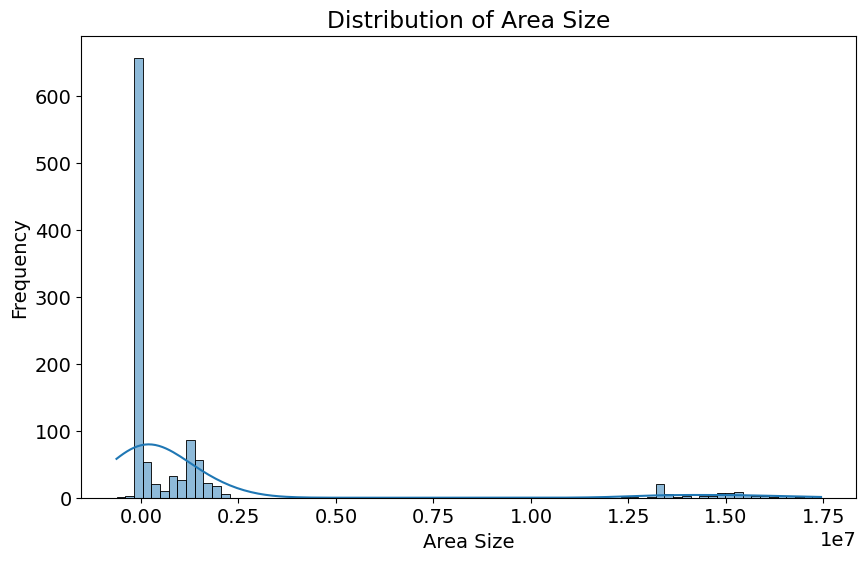

In [632]:
# Visualize area size distribution
plt.figure(figsize=(10, 6))
sns.histplot(yearly_df['area_size'], kde=True)
plt.title('Distribution of Area Size')
plt.xlabel('Area Size')
plt.ylabel('Frequency')
plt.show()

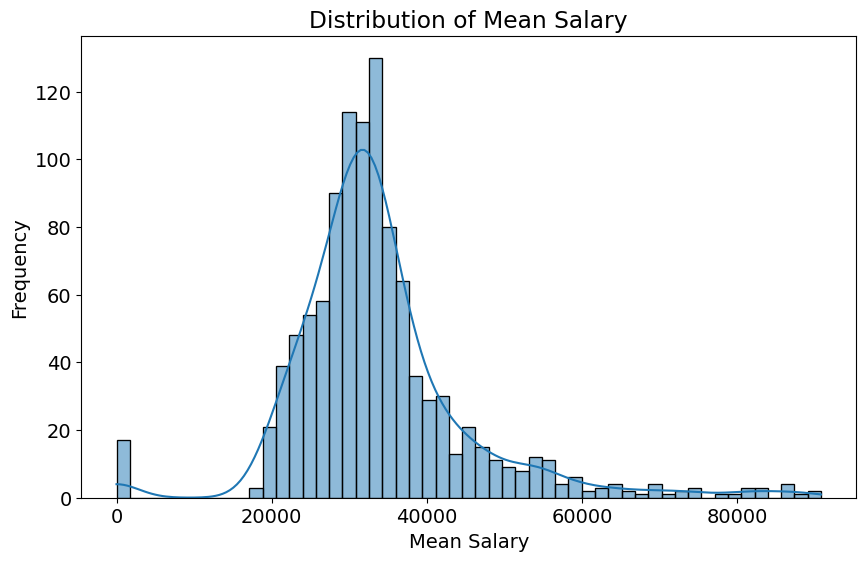

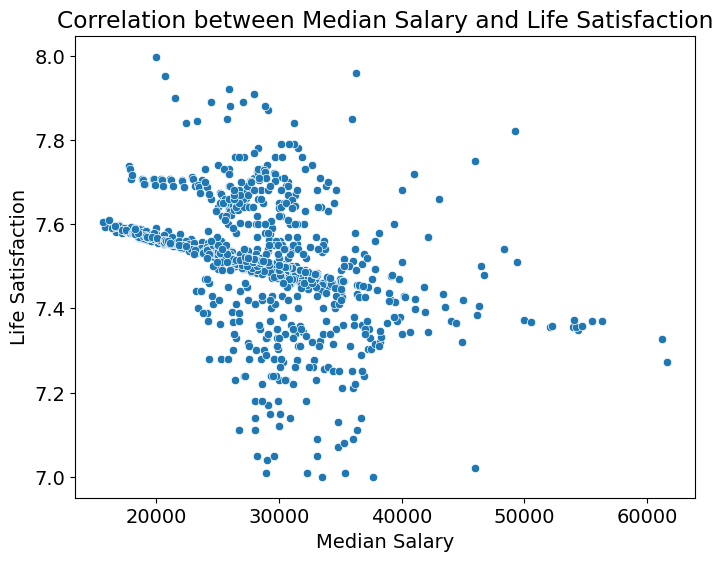

In [633]:
# Visualize mean salary distribution
plt.figure(figsize=(10, 6))
sns.histplot(yearly_df['mean_salary'], kde=True)
plt.title('Distribution of Mean Salary')
plt.xlabel('Mean Salary')
plt.ylabel('Frequency')
plt.show()

# Visualize correlation between median salary and life satisfaction
plt.figure(figsize=(8, 6))
sns.scatterplot(x=yearly_df['median_salary'], y=yearly_df['life_satisfaction'])
plt.title('Correlation between Median Salary and Life Satisfaction')
plt.xlabel('Median Salary')
plt.ylabel('Life Satisfaction')
plt.show()

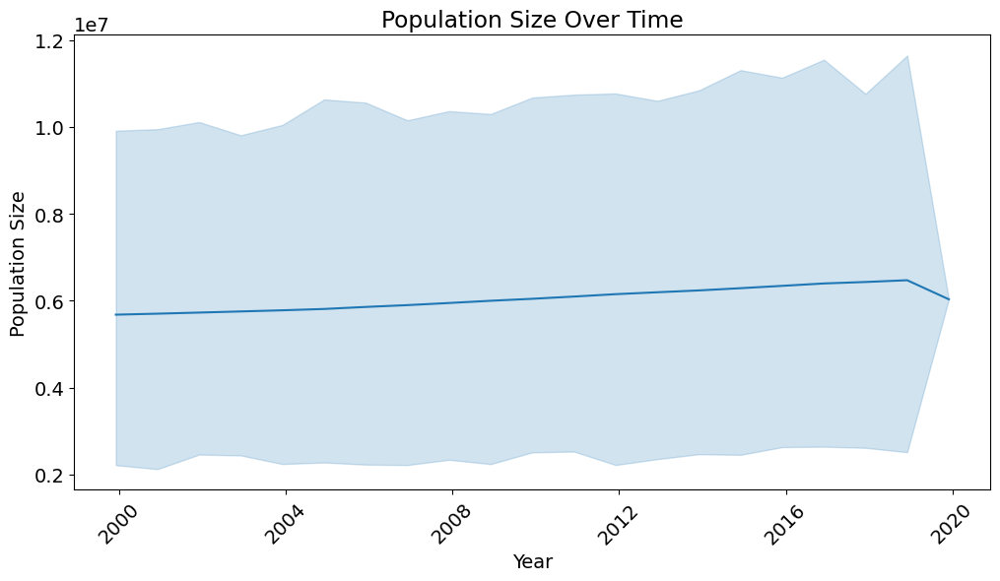

In [634]:
# Visualize population size over time
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='population_size', data=yearly_df)
plt.title('Population Size Over Time')
plt.xlabel('Year')
plt.ylabel('Population Size')
plt.xticks(rotation=45)
plt.show()


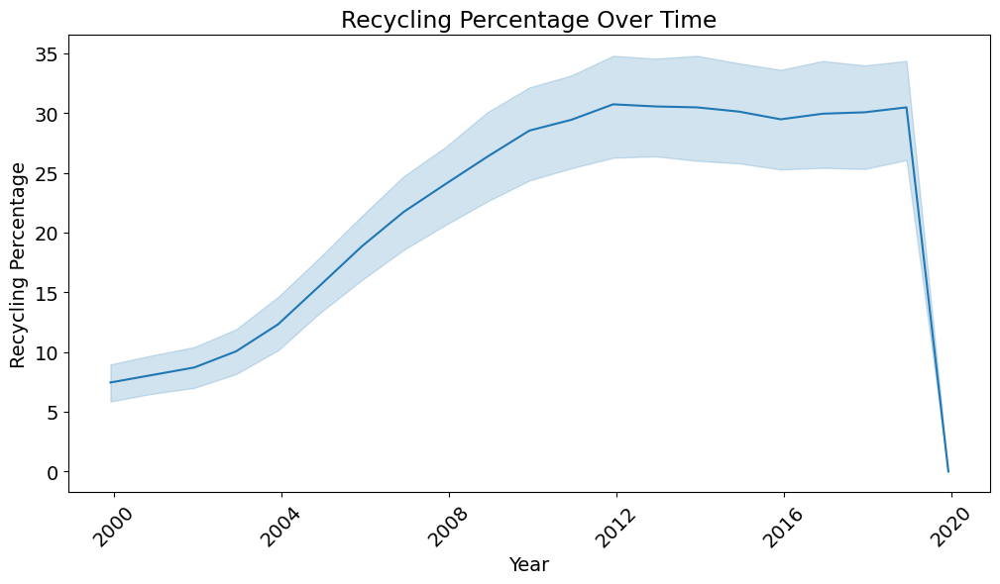

In [635]:
# Visualize recycling percentage over time
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='recycling_pct', data=yearly_df)
plt.title('Recycling Percentage Over Time')
plt.xlabel('Year')
plt.ylabel('Recycling Percentage')
plt.xticks(rotation=45)
plt.show()


# Feature Engineering

In [864]:
# Create new feature: Crimes per House
monthly_df['crimes_per_house'] = monthly_df['no_of_crimes'] / monthly_df['houses_sold'].replace(0, 1)

# Create new feature: House Price Change
monthly_df['price_change'] = monthly_df.groupby('area')['average_price'].pct_change()

# Create new feature: Jobs per Population
yearly_df['jobs_per_population'] = yearly_df['number_of_jobs'] / yearly_df['population_size']

monthly_df['year'] = monthly_df['date'].dt.year
monthly_df['month'] = monthly_df['date'].dt.month

# Create new feature: Is High Crime Rate
monthly_df['is_high_crime'] = (monthly_df['no_of_crimes'] > monthly_df['no_of_crimes'].quantile(0.75)).astype(int)

# Create new feature: Population Growth Rate
yearly_df['population_growth_rate'] = yearly_df['population_size'].pct_change()

# Create new feature: Average Salary per Area
yearly_df['average_salary_per_area'] = yearly_df['median_salary'] / yearly_df['area_size']

# Create new feature: House Price Index
monthly_df['house_price_index'] = monthly_df.groupby('area')['average_price'].transform(lambda x: x / x.iloc[0])

# Create new feature: Population to House Ratio
yearly_df['population_to_house_ratio'] = yearly_df['population_size'] / yearly_df['no_of_houses']

# Create new feature: Interaction between Salary and Population
yearly_df['salary_population_interaction'] = yearly_df['median_salary'] * yearly_df['population_size']

# Create new feature: House Price Change Rate
monthly_df['house_price_change_rate'] = monthly_df.groupby('area')['average_price'].pct_change()

# Create new feature: Area Size Rank
boroughs['area_size_rank'] = boroughs['HECTARES'].rank(ascending=False)

# Create new feature: Population Rank
yearly_df['population_rank'] = yearly_df['population_size'].rank(ascending=False)

# Create new feature: Historical Average Price
monthly_df['historical_avg_price'] = monthly_df.groupby('area')['average_price'].transform('mean')

# Create new feature: Historical Median Salary
yearly_df['historical_median_salary'] = yearly_df.groupby('area')['median_salary'].transform('mean')

# Create new feature: Historical Price Change Rate
monthly_df['historical_price_change_rate'] = monthly_df.groupby('area')['price_change'].transform('mean')

# Create new feature: Population Change Rate
yearly_df['population_change_rate'] = yearly_df['population_size'].pct_change()

# Create new feature: Employment Density
yearly_df['employment_density'] = yearly_df['number_of_jobs'] / yearly_df['area_size']


# Additional Exporatory Data Analysis (EDA)

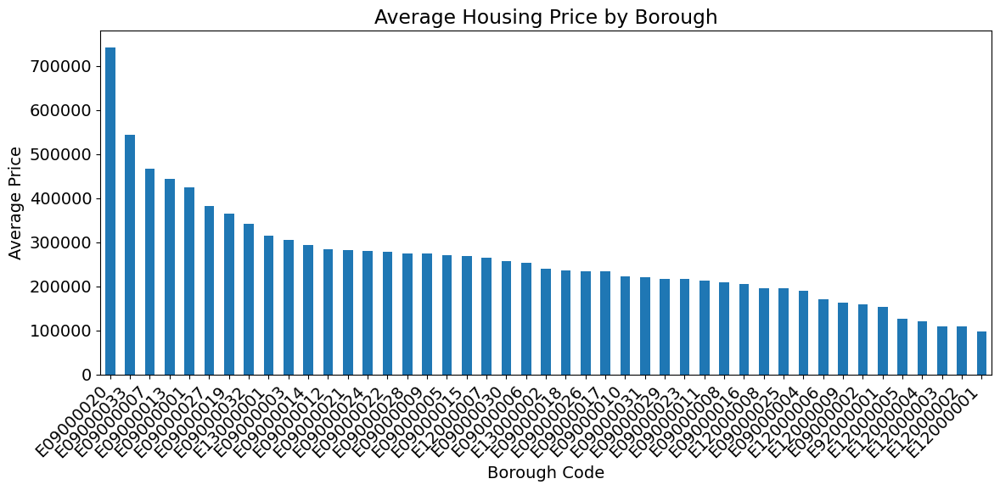

In [865]:
# Analyze the trends in average price by borough
boroughs_avg_price = monthly_df.groupby('code')['average_price'].mean()
boroughs_avg_price = boroughs_avg_price.sort_values(ascending=False)

# Plot the average price by borough
plt.figure(figsize=(12, 6))
boroughs_avg_price.plot(kind='bar')
plt.title('Average Housing Price by Borough')
plt.xlabel('Borough Code')
plt.ylabel('Average Price')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


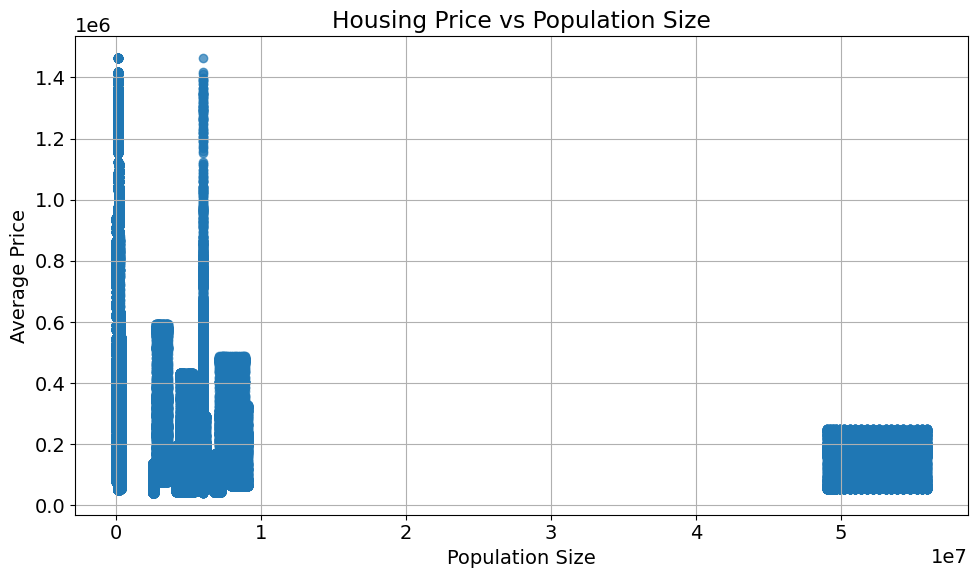

In [638]:
# Compare housing prices and population size
boroughs_pop_price = monthly_df.merge(yearly_df,on='code',how='left')

# Scatter plot of housing price vs population size
plt.figure(figsize=(10, 6))
plt.scatter(boroughs_pop_price['population_size'], boroughs_pop_price['average_price'], alpha=0.7)
plt.title('Housing Price vs Population Size')
plt.xlabel('Population Size')
plt.ylabel('Average Price')
plt.grid()
plt.tight_layout()
plt.show()


## Interactive Time Series: Average House Prices Over Time:

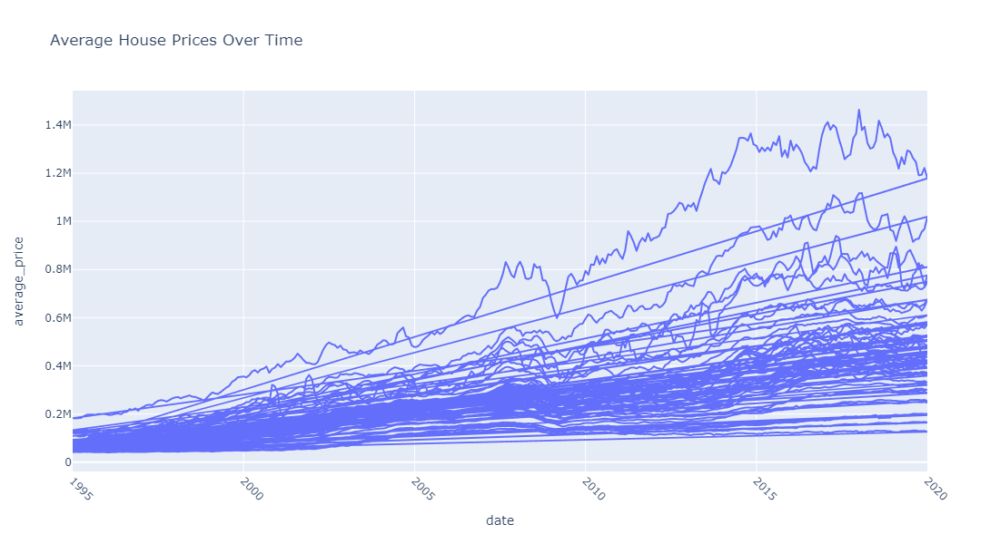

In [639]:
# Create an interactive line plot for average house prices over time
fig = px.line(monthly_df, x='date', y='average_price', title='Average House Prices Over Time')
fig.update_layout(width=800,
                 height=600)
fig.update_xaxes(tickangle=45)
fig.show()

## Interactive Scatter Plot: Crime Rate vs Average Price by Area:

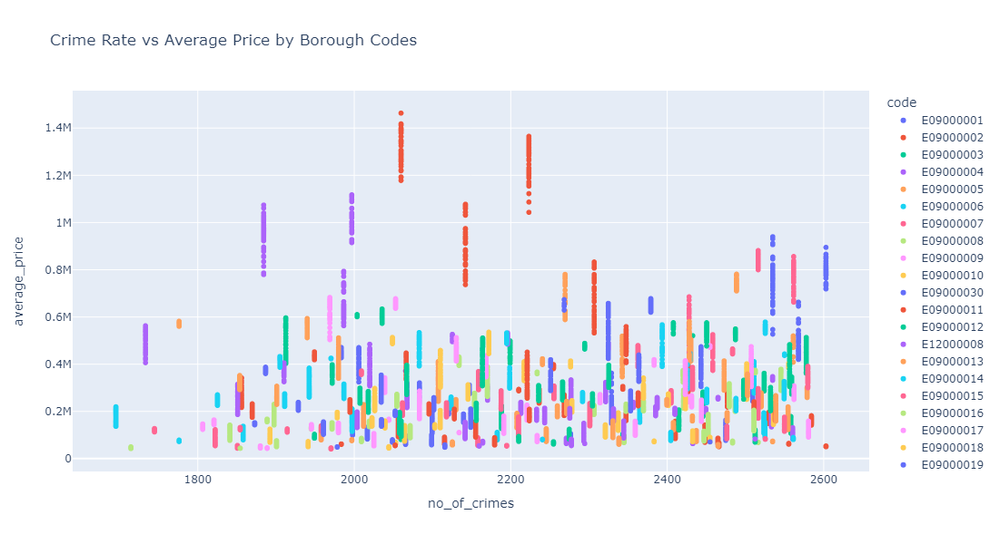

In [640]:
# Create an interactive scatter plot for crime rate vs average price by borough
fig = px.scatter(monthly_df, x='no_of_crimes', y='average_price', color='code', title='Crime Rate vs Average Price by Borough Codes')
fig.update_layout(width=800,
                 height=600)

fig.show()


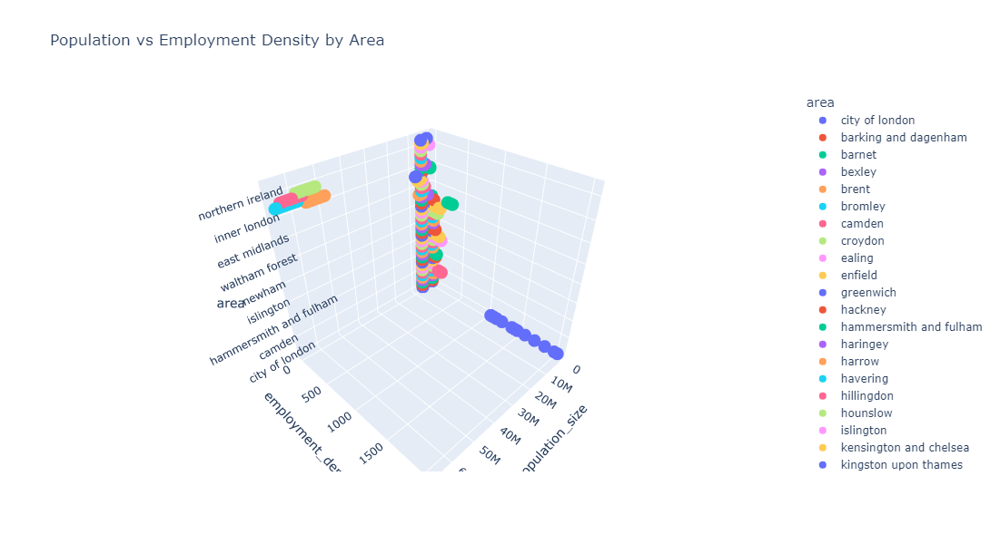

In [641]:
                
# Create an interactive 3D scatter plot for population vs employment density by borough
fig = px.scatter_3d(yearly_df, x='population_size', y='employment_density', z='area', color='area', title='Population vs Employment Density by Area')
fig.update_layout(width=800,
                 height=600)
                  
fig.show()


## Interactive Line Plot: Yearly Trends of Median Salary and Number of Jobs:

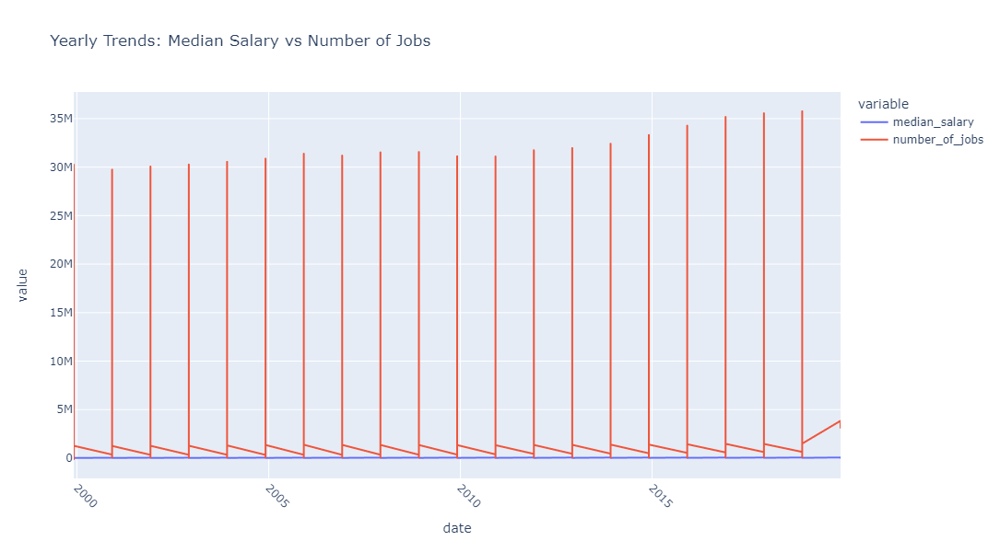

In [642]:
# Create an interactive line plot for yearly trends of median salary and number of jobs
fig = px.line(yearly_df, x='date', y=['median_salary', 'number_of_jobs'], title='Yearly Trends: Median Salary vs Number of Jobs')
fig.update_layout(width=800,
                 height=600)
                  
fig.update_xaxes(tickangle=45)
fig.show()

##	Interactive Heatmap: Median Salary and Life Satisfaction by Borough:

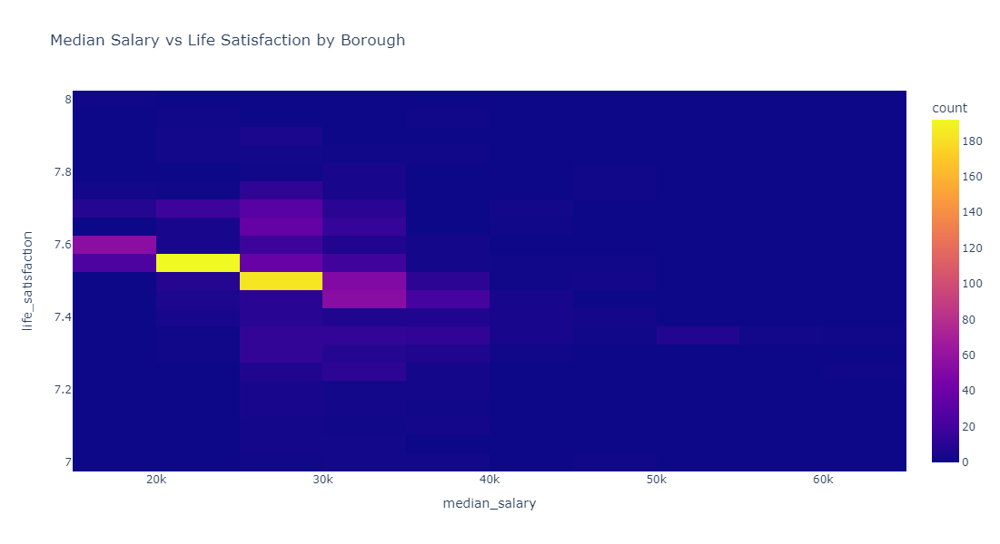

In [643]:
#	Interactive Parallel Coordinates Plot: Selected Features and Average Price:
all_data = pd.concat([monthly_df,yearly_df,boroughs,wards],axis=1).drop_duplicates()
# Create an interactive heatmap for median salary and life satisfaction by borough
fig = px.density_heatmap(yearly_df, x='median_salary', y='life_satisfaction', title='Median Salary vs Life Satisfaction by Borough')
fig.update_layout(width=800,
                 height=600)
                  
fig.show()

In [644]:
all_data=pd.concat([monthly_df,yearly_df,boroughs,wards],axis=1)

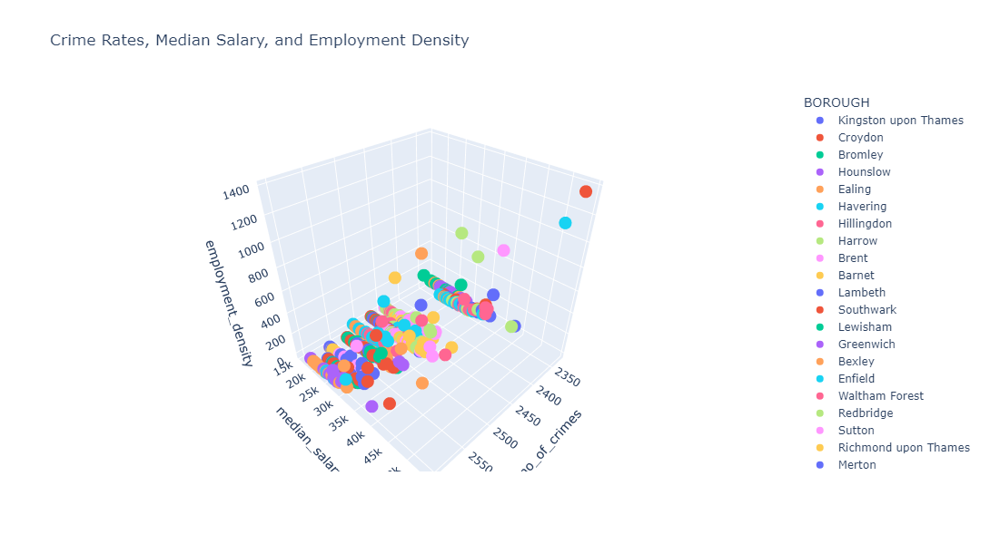

In [645]:
# Interactive 3D Scatter Plot: Crime Rates, Median Salary, and Employment Density:

# Create an interactive 3D scatter plot for crime rates, median salary, and employment density
fig = px.scatter_3d(all_data, x='no_of_crimes', y='median_salary', z='employment_density', color='BOROUGH', title='Crime Rates, Median Salary, and Employment Density')
fig.update_layout(width=800,
                 height=600)
fig.show()

In [873]:
# Convert the 'area' column to numerical values
enconder = OneHotEncoder(sparse_output=False)
monthly_df['area'] = enconder.fit_transform(monthly_df['area'].values.reshape(-1,1))
monthly_df['code'] = enconder.fit_transform(monthly_df['code'].values.reshape(-1,1))
# Display the updated DataFrame
display(monthly_df)

,date,area,average_price,code,houses_sold,no_of_crimes,borough_flag,rolling_avg,crimes_per_house,price_change,year,month,is_high_crime,house_price_index,house_price_change_rate,historical_avg_price,historical_price_change_rate
0,1995-01-01,0.00,"91,449.00",1.00,17.00,"2,474.78",1,"84,257.67",145.58,-0.10,1995,1,1,1.00,-0.10,"423,942.58",0.01
1,1995-02-01,0.00,"82,203.00",1.00,7.00,"2,474.78",1,"84,257.67",353.54,-0.10,1995,2,1,0.90,-0.10,"423,942.58",0.01
2,1995-03-01,0.00,"79,121.00",1.00,14.00,"2,474.78",1,"84,257.67",176.77,-0.04,1995,3,1,0.87,-0.04,"423,942.58",0.01
3,1995-04-01,0.00,"77,101.00",1.00,7.00,"2,474.78",1,"79,475.00",353.54,-0.03,1995,4,1,0.84,-0.03,"423,942.58",0.01
4,1995-05-01,0.00,"84,409.00",1.00,10.00,"2,474.78",1,"80,210.33",247.48,0.09,1995,5,1,0.92,0.09,"423,942.58",0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13544,2019-09-01,0.00,"249,942.00",0.00,"64,605.00","2,399.47",0,"249,312.00",0.04,0.00,2019,9,0,4.70,0.00,"153,068.84",0.01
13545,2019-10-01,0.00,"249,376.00",0.00,"68,677.00","2,399.47",0,"249,583.33",0.03,-0.00,2019,10,0,4.69,-0.00,"153,068.84",0.01
13546,2019-11-01,0.00,"248,515.00",0.00,"67,814.00","2,399.47",0,"249,277.67",0.04,-0.00,2019,11,0,4.67,-0.00,"153,068.84",0.01
13547,2019-12-01,0.00,"250,410.00",0.00,"67,814.00","2,399.47",0,"249,433.67",0.04,0.01,2019,12,0,4.71,0.01,"153,068.84",0.01


## Box Plot for Outlier Detention for the Target Variable

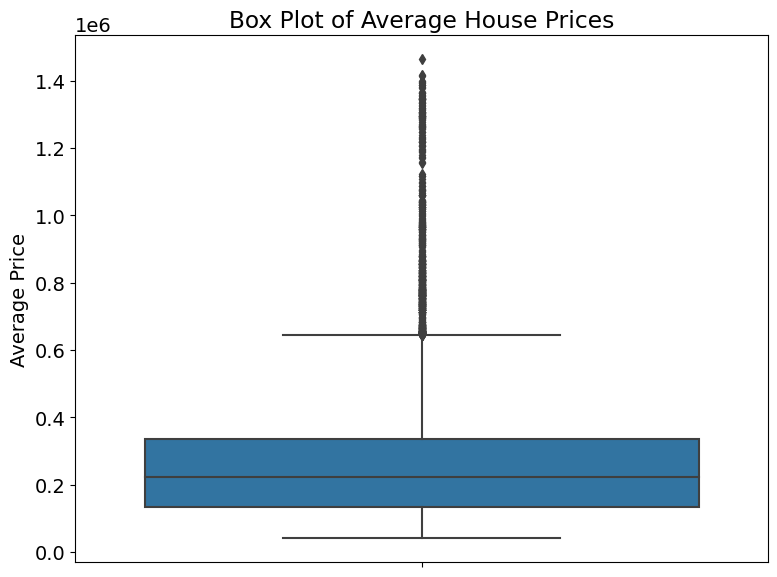

In [874]:
# Visualize outliers in average house prices using a box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=monthly_df, y='average_price')
plt.title('Box Plot of Average House Prices')
plt.ylabel('Average Price')
plt.tight_layout()
plt.show()

## 	Interquartile Range (IQR) Method for Outlier Detection and Removal:

The IQR is the range between the first quartile (25th percentile) and the third quartile (75th percentile). Data points outside this range can be considered outliers.

In [648]:
# Calculate the IQR for average house prices
Q1 = monthly_df['average_price'].quantile(0.25)
Q3 = monthly_df['average_price'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for outlier detection
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers based on the bounds
outliers = monthly_df[(monthly_df['average_price'] < lower_bound) | (monthly_df['average_price'] > upper_bound)]

# Remove outliers from the dataset
cleaned_df = monthly_df[(monthly_df['average_price'] >= lower_bound) & (monthly_df['average_price'] <= upper_bound)]

## View the boxplot after removing the ooutliers

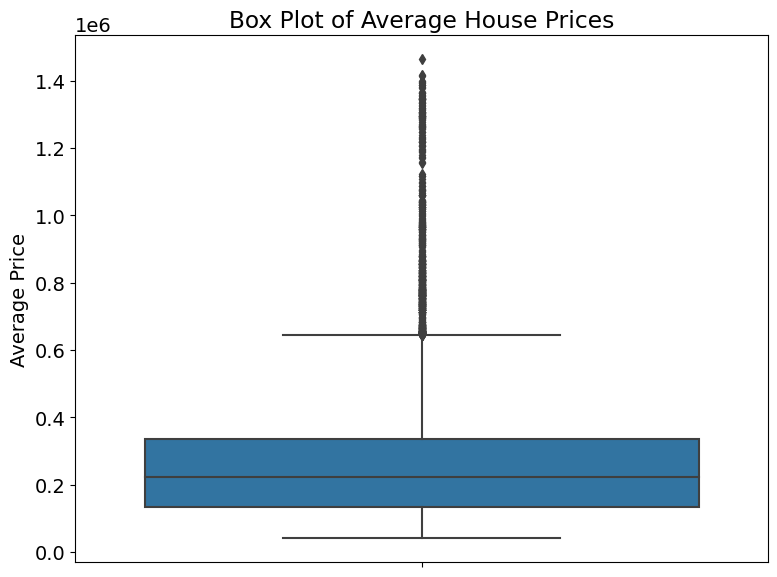

In [649]:
# Visualize outliers in average house prices using a box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=monthly_df, y='average_price')
plt.title('Box Plot of Average House Prices')
plt.ylabel('Average Price')
plt.tight_layout()
plt.show()

## Visualizing Outliers in Scatter Plots: 

Scatter plots can help visualize the presence of outliers in relationships between variables.

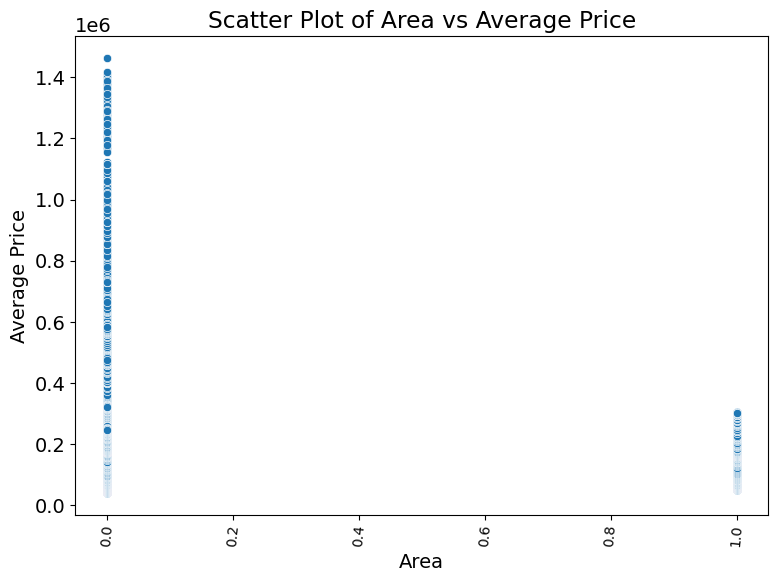

In [650]:
# Visualize outliers in a scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=monthly_df, x='area', y='average_price')
plt.title('Scatter Plot of Area vs Average Price')
plt.xlabel('Area')
plt.ylabel('Average Price')
plt.tight_layout()
plt.xticks(rotation =85,fontsize=10)
plt.show()

## Z-Score Method for Outlier Detection and Removal: 

The Z-score measures how many standard deviations a data point is away from the mean. Data points with a Z-score above a certain threshold can be considered outliers.

In [651]:
# Calculate Z-scores for average house prices
z_scores = zscore(monthly_df['average_price'])

# Define a threshold for outlier detection
threshold = 3

# Identify outliers based on the threshold
outliers = monthly_df[abs(z_scores) > threshold]

# Remove outliers from the dataset
cleaned_df_2 = monthly_df[abs(z_scores) <= threshold]


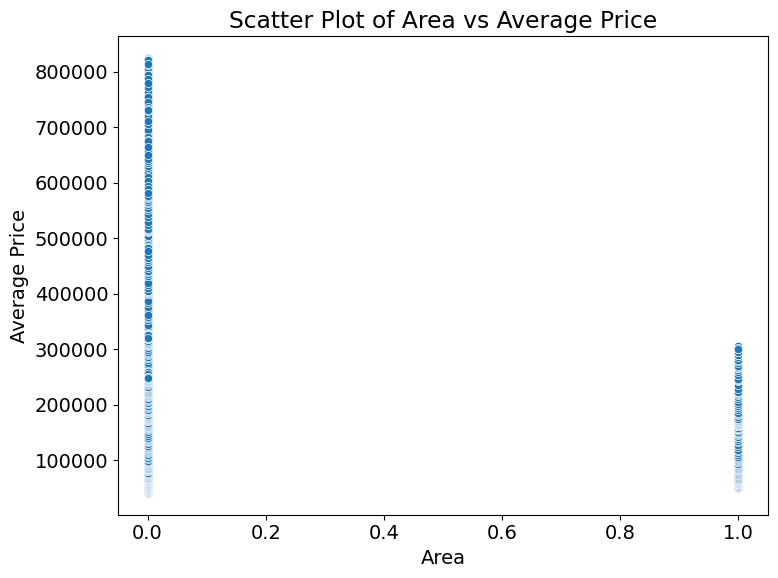

In [652]:
# Visualize outliers in a scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=cleaned_df_2, x='area', y='average_price')
plt.title('Scatter Plot of Area vs Average Price')
plt.xlabel('Area')
plt.ylabel('Average Price')
plt.tight_layout()
plt.show()


## Visualizing Outliers in Other Columns:

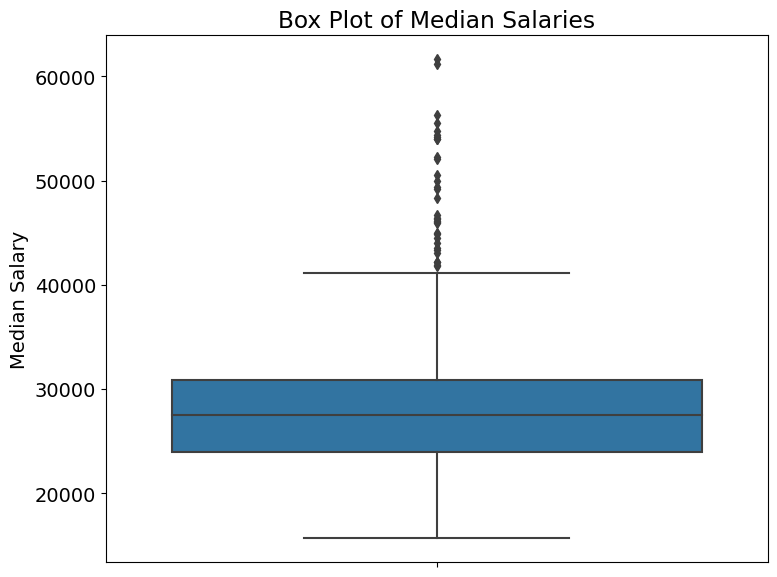

In [653]:
# Visualize outliers in 'median_salary' using a box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=yearly_df, y='median_salary')
plt.title('Box Plot of Median Salaries')
plt.ylabel('Median Salary')
plt.tight_layout()
plt.show()

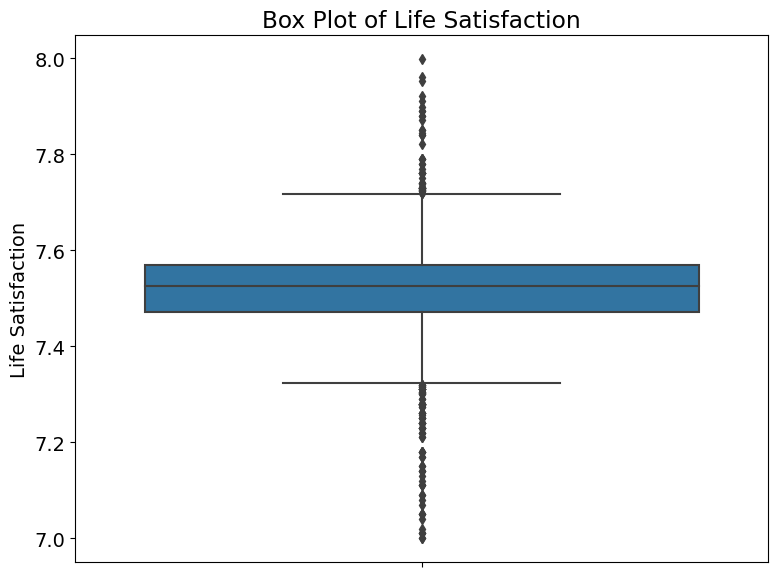

In [654]:
# Visualize outliers in 'life_satisfaction' using a box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=yearly_df, y='life_satisfaction')
plt.title('Box Plot of Life Satisfaction')
plt.ylabel('Life Satisfaction')
plt.tight_layout()
plt.show()

##	Handling Outliers in Other Columns:

In [655]:
# Calculate Z-scores for 'median_salary'
z_scores_salary = zscore(yearly_df['median_salary'])

# Define a threshold for outlier detection
threshold_salary = 3

# Identify outliers based on the threshold
outliers_salary = yearly_df[abs(z_scores_salary) > threshold_salary]

# Remove outliers from the dataset
cleaned_data_salary = yearly_df[abs(z_scores_salary) <= threshold_salary]

# Calculate Z-scores for 'life_satisfaction'
z_scores_life_satisfaction = zscore(yearly_df['life_satisfaction'])

# Define a threshold for outlier detection
threshold_life_satisfaction = 3

# Identify outliers based on the threshold
outliers_life_satisfaction = yearly_df[abs(z_scores_life_satisfaction) > threshold_life_satisfaction]

# Remove outliers from the dataset
cleaned_data_life_satisfaction = yearly_df[abs(z_scores_life_satisfaction) <= threshold_life_satisfaction]

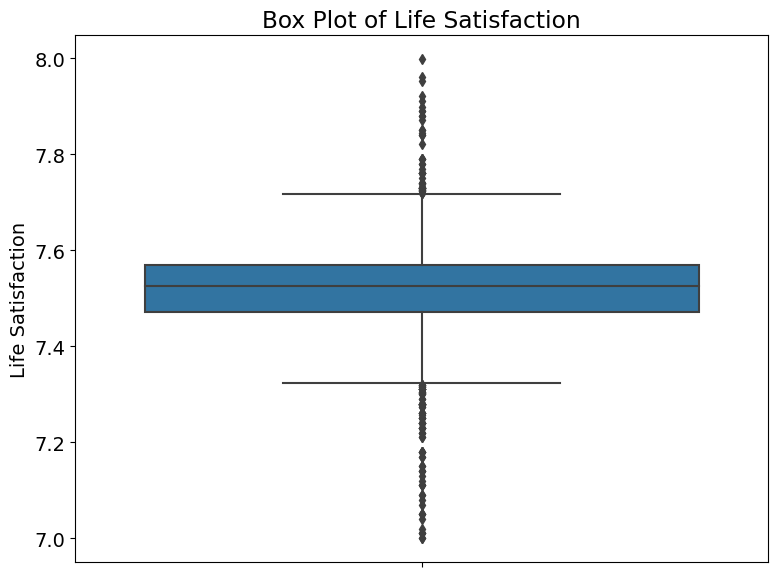

In [656]:
# Visualize outliers in 'life_satisfaction' using a box plot
plt.figure(figsize=(8, 6))
sns.boxplot(data=yearly_df, y='life_satisfaction')
plt.title('Box Plot of Life Satisfaction')
plt.ylabel('Life Satisfaction')
plt.tight_layout()
plt.show()

## Remove all outliers

In [657]:
monthly_df.dtypes

date                            datetime64[ns]
area                                   float64
average_price                          float64
code                                   float64
houses_sold                            float64
no_of_crimes                           float64
borough_flag                             int64
rolling_avg                            float64
crimes_per_house                       float64
price_change                           float64
year                                     int32
month                                    int32
is_high_crime                            int32
house_price_index                      float64
house_price_change_rate                float64
historical_avg_price                   float64
historical_price_change_rate           float64
dtype: object

In [658]:
columns_with_outliers = ['area', 'houses_sold', 'no_of_crimes',
       'borough_flag', 'crimes_per_house', 'price_change', 'year', 'month',
       'is_high_crime', 'house_price_index', 'house_price_change_rate',
       'historical_avg_price', 'historical_price_change_rate']

# Calculate the IQR for average house prices
Q1 = monthly_df[columns_with_outliers].quantile(0.25)
Q3 = monthly_df[columns_with_outliers].quantile(0.75)
IQR = Q3 - Q1

# Define a threshold for outlier detection
outliers_threshold = 1.5

# Identify outliers based on the bounds

outlier_mask = (monthly_df[columns_with_outliers] < (Q1 -outliers_threshold * IQR)) | (monthly_df[columns_with_outliers] > (Q3 + outliers_threshold * IQR))

# Remove outliers from the dataset
cleaned_monthly_df = monthly_df[~outlier_mask.any(axis=1)]

## View the new distributions

array([[<Axes: title={'center': 'date'}>,
        <Axes: title={'center': 'area'}>,
        <Axes: title={'center': 'average_price'}>,
        <Axes: title={'center': 'code'}>],
       [<Axes: title={'center': 'houses_sold'}>,
        <Axes: title={'center': 'no_of_crimes'}>,
        <Axes: title={'center': 'borough_flag'}>,
        <Axes: title={'center': 'rolling_avg'}>],
       [<Axes: title={'center': 'crimes_per_house'}>,
        <Axes: title={'center': 'price_change'}>,
        <Axes: title={'center': 'year'}>,
        <Axes: title={'center': 'month'}>],
       [<Axes: title={'center': 'is_high_crime'}>,
        <Axes: title={'center': 'house_price_index'}>,
        <Axes: title={'center': 'house_price_change_rate'}>,
        <Axes: title={'center': 'historical_avg_price'}>],
       [<Axes: title={'center': 'historical_price_change_rate'}>,
        <Axes: >, <Axes: >, <Axes: >]], dtype=object)

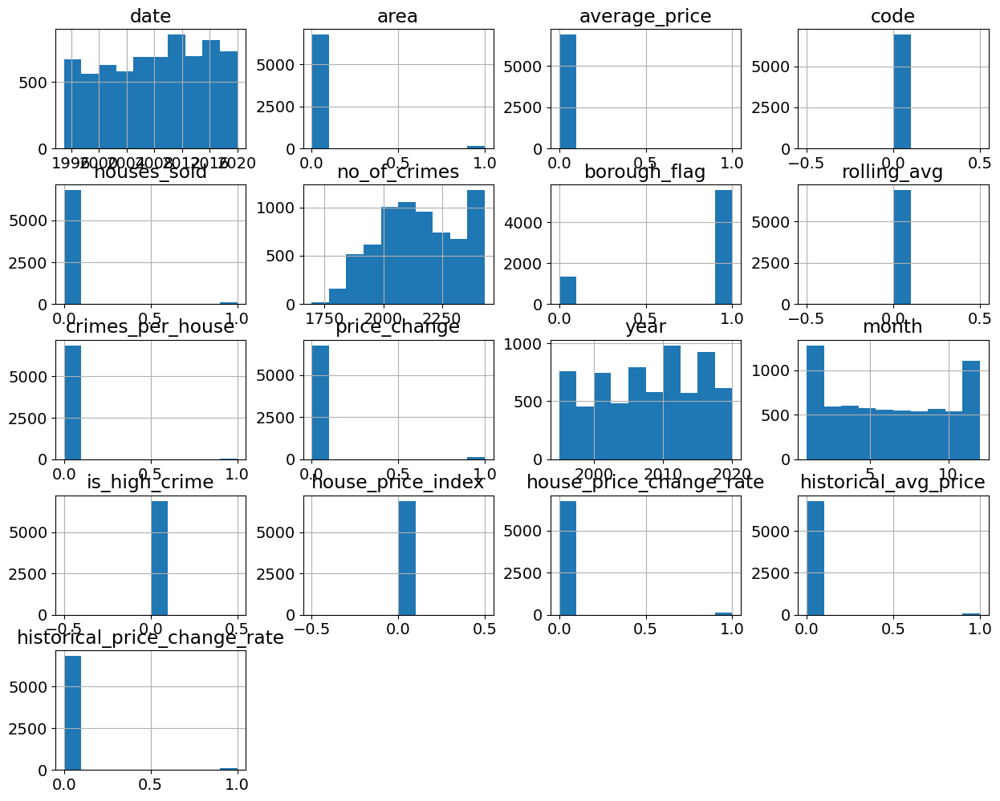

In [659]:
cleaned_monthly_df.hist()

In [660]:
cleaned_monthly_df.shape

(6903, 17)

Removing outliers, drastically reduced our data, instead let us standardized the data to take values between 0 and 1 before training our model, we are going to see this later on. So, I am not considering the removed outliers

In [868]:
# Fill missing values for the created features
monthly_df['house_price_change_rate'] = monthly_df['house_price_change_rate'].fillna(method='bfill')
monthly_df['price_change'] = monthly_df['price_change'].fillna(method='bfill')

In [869]:
cleaned_monthly_df = pd.DataFrame(cleaned_monthly_df)
monthly_df.shape

(13549, 17)

# Feature Selection

### Visualize Relationship Among Features

In [870]:
features = monthly_df.columns

C:\Users\Joben\anaconda3\envs\TechScholarHub\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



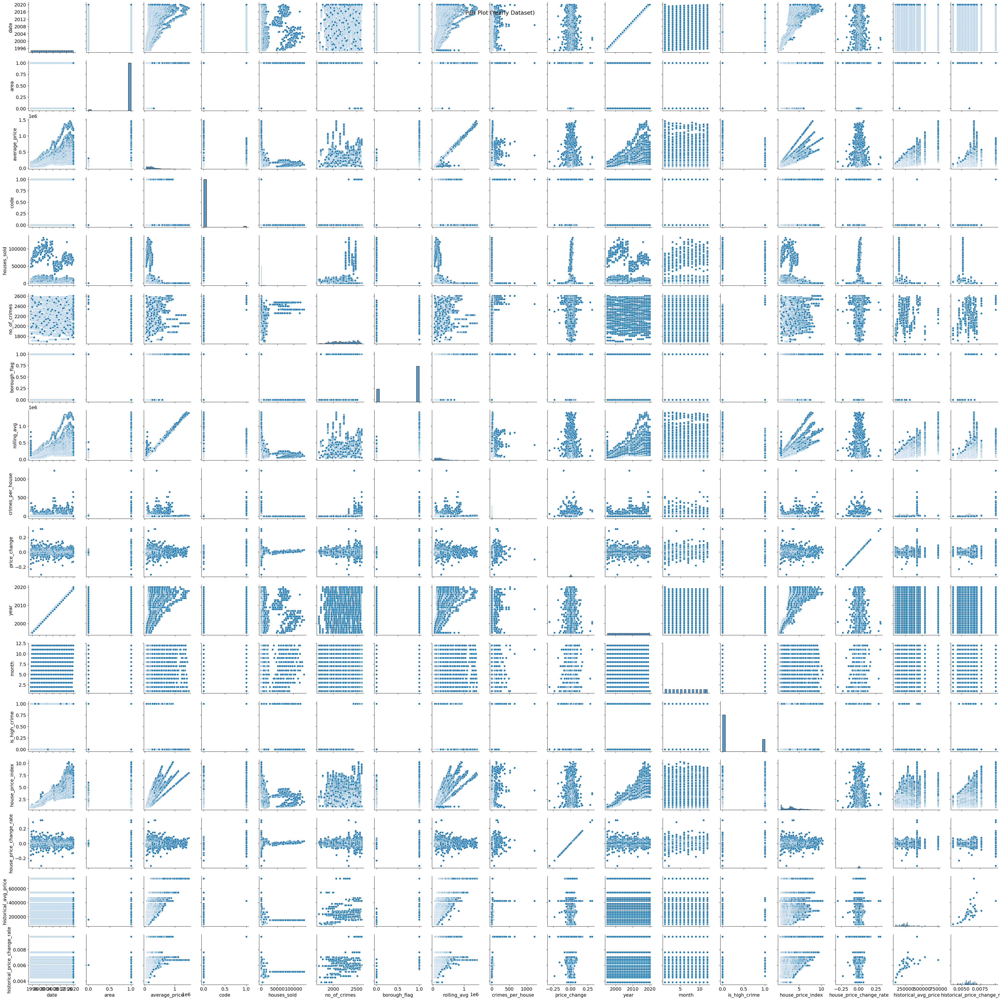

In [119]:
# Pair plot for yearly_df
sns.pairplot(monthly_df, vars= features)
plt.suptitle("Pair Plot (Monthly Dataset)")
plt.show()

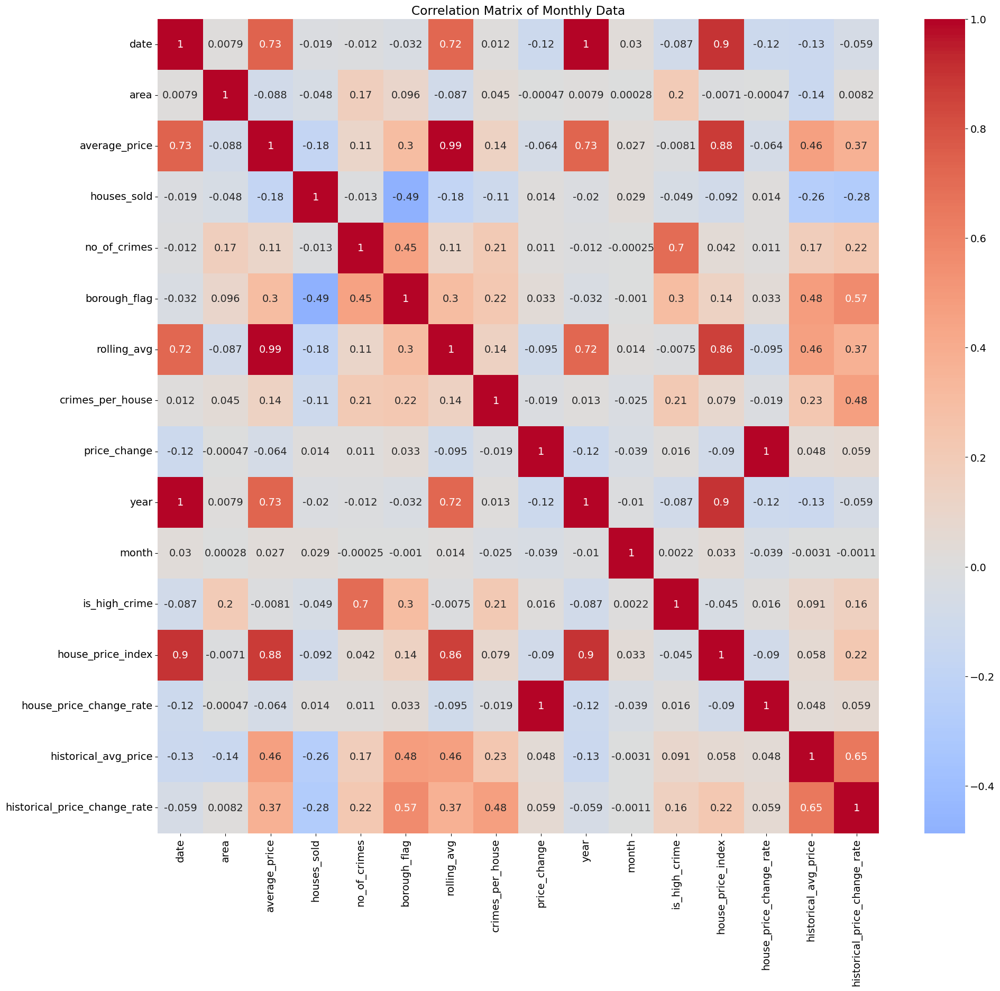

Highly correlated pairs:
date - average_price: 0.73
date - rolling_avg: 0.72
date - year: 1.00
date - house_price_index: 0.90
average_price - date: 0.73
average_price - rolling_avg: 0.99
average_price - year: 0.73
average_price - house_price_index: 0.88
no_of_crimes - is_high_crime: 0.70
borough_flag - historical_price_change_rate: 0.57
rolling_avg - date: 0.72
rolling_avg - average_price: 0.99
rolling_avg - year: 0.72
rolling_avg - house_price_index: 0.86
price_change - house_price_change_rate: 1.00
year - date: 1.00
year - average_price: 0.73
year - rolling_avg: 0.72
year - house_price_index: 0.90
is_high_crime - no_of_crimes: 0.70
house_price_index - date: 0.90
house_price_index - average_price: 0.88
house_price_index - rolling_avg: 0.86
house_price_index - year: 0.90
house_price_change_rate - price_change: 1.00
historical_avg_price - historical_price_change_rate: 0.65
historical_price_change_rate - borough_flag: 0.57
historical_price_change_rate - historical_avg_price: 0.65


In [902]:
plt.figure(figsize=(22, 20))
corr_matrix = cleaned_df.drop(columns="code").corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix of Monthly Data')
plt.show()

# Identify correlations between variables
correlation_threshold = 0.5
high_corr_pairs = [(var1, var2) for var1 in corr_matrix.columns for var2 in corr_matrix.columns
                   if abs(corr_matrix.loc[var1, var2]) > correlation_threshold and var1 != var2]

print('Highly correlated pairs:')
for var1, var2 in high_corr_pairs:
    print(f'{var1} - {var2}: {corr_matrix.loc[var1, var2]:.2f}')

## Filter and Select highly Correlated Features for Our Machine Learning

In [903]:
correlation_matrix = monthly_df.drop(columns="code").corr()
correlated_features = corr_matrix >= 0.5
correlated_features.index

Index(['date', 'area', 'average_price', 'houses_sold', 'no_of_crimes',
       'borough_flag', 'rolling_avg', 'crimes_per_house', 'price_change',
       'year', 'month', 'is_high_crime', 'house_price_index',
       'house_price_change_rate', 'historical_avg_price',
       'historical_price_change_rate'],
      dtype='object')

In [904]:
monthly_df.date = pd.to_numeric(monthly_df.date)

In [905]:
correlated_features = ['date', 'area', 'average_price', 'houses_sold', 'no_of_crimes',
       'borough_flag', 'rolling_avg', 'crimes_per_house', 'price_change',
       'year', 'month', 'is_high_crime', 'house_price_index',
       'house_price_change_rate', 'historical_avg_price',
       'historical_price_change_rate']

In [906]:
# Initials the independent and target variable
X = monthly_df[correlated_features].drop(columns='average_price')
y = monthly_df.average_price

# Split test into training and testing data

In [921]:
x_train, x_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [922]:
print("x_train shape:",x_train.shape)
print("y_train shape:",x_train.shape)
print("x_test shape:",x_train.shape)
print("y_test shape:",x_train.shape)

x_train shape: (10839, 15)
y_train shape: (10839, 15)
x_test shape: (10839, 15)
y_test shape: (10839, 15)


# Standardize the Data

In [923]:
scaler = StandardScaler()
X_train = scaler.fit_transform(x_train)
X_test = scaler.transform(x_test)

In [924]:
# view how the data looks like
X_train_scaled.shape

(10839, 15)

In [925]:
y_train.shape

(10839,)

# Model Selection and Training

In [926]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

# Make Prediction of the test data

In [927]:
y_hat = model.predict(X_test)
y_hat

array([359735.48333032, 188851.7843429 , 301294.1906514 , ...,
       403578.27492043,  52492.49944911,  83896.6625285 ])

In [928]:
# Evaluate the model's performance
mse = mean_squared_error(y_test, y_hat)
print(f'Mean Squared Error: {mse:.2f}')

Mean Squared Error: 215610678.53


In [929]:
# Calculate Mean Squared Error (MSE) and R-squared
rmse = 
mse = mean_squared_error(y_test, y_hat)
r2 = r2_score(y_test, y_hat)
mae = mean_absolute_error(y_test,y_hat)
print(f'Mean Squared Error: {mse:.2f}')
print(f'R-squared: {r2:.2f}')

Mean Squared Error: 215610678.53
R-squared: 0.99


## Plot the Predictions

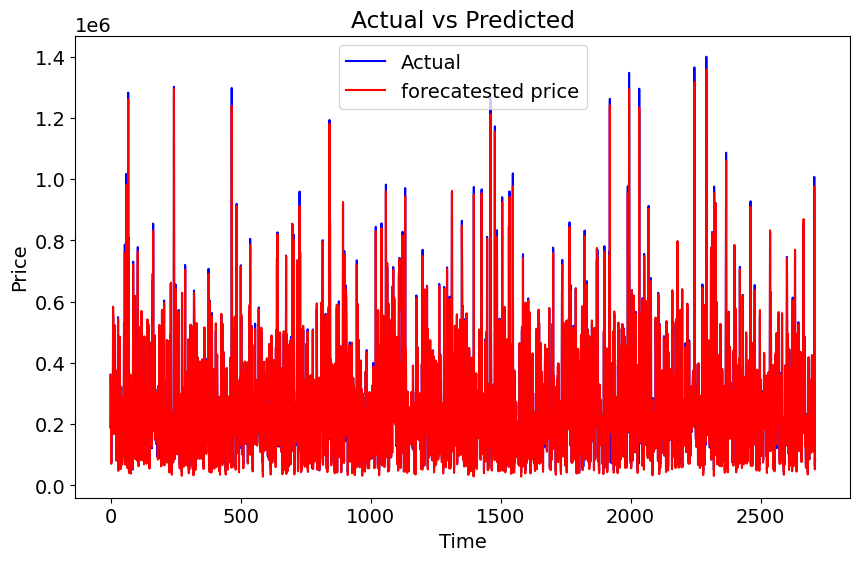

In [961]:
# Plot the actual vs predicted values
plt.figure(figsize=(10,6))
plt.plot(range(len(X_test)), y_test,color='blue',label='Actual')
#plt.plot(y_test,y_hat,color='red',label='Predicted')
plt.plot(range(len(y_hat)),y_hat,label='forecatested price',color='red')
plt.legend()
plt.title("Actual vs Predicted")
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()

Wow! Good Model, Can you see that?

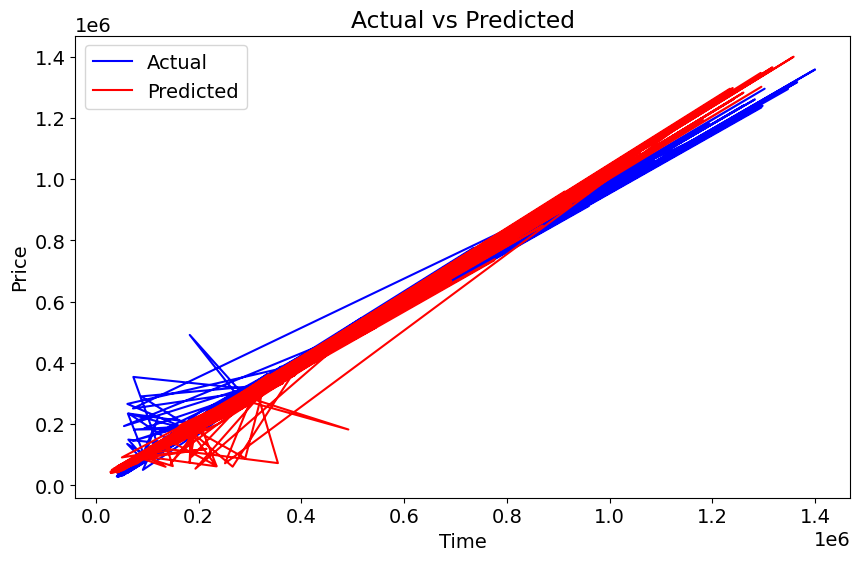

In [962]:
# Plot the actual vs predicted values
plt.figure(figsize=(10,6))
plt.plot(y_test,y_hat,color='blue',label='Actual')
plt.plot(y_hat,y_test,color='red',label="Predicted")
#plt.plot(len(y_test) + range(len(y_hat)),y_hat,label='forecatested price')
plt.legend()
plt.title("Actual vs Predicted")
plt.xlabel("Time")
plt.ylabel("Price")
plt.show()

# Perform Experimentation

In [166]:
# Try different models, hyperparameters, and feature sets
# For example, let's try a Random Forest Regressor with varying n_estimators

rf_mses = []
rf_r2s = []
n_estimators_values = [10, 50, 100, 200]

for n_estimators in n_estimators_values:
    rf_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42)
    rf_model.fit(X_train, y_train)
    rf_y_pred = rf_model.predict(X_test)
    rf_mse = mean_squared_error(y_test, rf_y_pred)
    rf_r2 = r2_score(y_test, rf_y_pred)
    rf_mses.append(rf_mse)
    rf_r2s.append(rf_r2)

# Print results for different n_estimators
for i, n_estimators in enumerate(n_estimators_values):
    print(f'Random Forest (n_estimators={n_estimators}):')
    print(f'Mean Squared Error: {rf_mses[i]:.2f}')
    print(f'R-squared: {rf_r2s[i]:.2f}')
    print()

Random Forest (n_estimators=10):
Mean Squared Error: 21908840.38
R-squared: 1.00

Random Forest (n_estimators=50):
Mean Squared Error: 18791376.46
R-squared: 1.00

Random Forest (n_estimators=100):
Mean Squared Error: 19141919.50
R-squared: 1.00

Random Forest (n_estimators=200):
Mean Squared Error: 18475818.46
R-squared: 1.00



# Cross Evaluation  Across 5 Folds

In [188]:
cross_val_mses = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')
cross_val_rmse = np.sqrt(-cross_val_mses)

print(f'Cross-Validation RMSE: {cross_val_rmse.mean():.2f} (±{cross_val_rmse.std():.2f})')

Cross-Validation RMSE: 23454.56 (±8184.84)


we got a better RMSE (loss) values

# Fine Tuning the Random Forest Model with GridSearchCV

In [189]:
# Define hyperparameter grid for grid search
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20, 30]
}

# Initialize the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(rf_model, param_grid, scoring='neg_mean_squared_error', cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and best estimator from grid search
best_params = grid_search.best_params_
best_rf_model = grid_search.best_estimator_

# Make predictions using the best estimator
best_y_pred = best_rf_model.predict(X_test)

# Evaluate the performance of the best model
best_mse = mean_squared_error(y_test, best_y_pred)
best_r2 = r2_score(y_test, best_y_pred)

print("Best Parameters:", best_params)
print(f'Best Model Mean Squared Error: {best_mse:.2f}')
print(f'Best Model R-squared: {best_r2:.2f}')

Best Parameters: {'max_depth': 10, 'n_estimators': 100}
Best Model Mean Squared Error: 22267975.19
Best Model R-squared: 1.00


## Exponential Smoothing Techniques

In [ ]:
# Convert 'date' column to datetime format
monthly_df['date'] = pd.to_datetime(monthly_df['date'])

# Set 'date' as index
monthly_df.set_index('date', inplace=True)

In [517]:
monthly_df['average_price'] = pd.to_numeric(monthly_df['average_price'],errors='coerce')

# Handle duplicated index
duplicated_indices = monthly_df.index[monthly_df.index.duplicated()]
print("Duplicated Indices:",duplicated_indices)

Duplicated Indices: DatetimeIndex([], dtype='datetime64[ns]', name='date', freq=None)


In [518]:
# Remove duplicated indices
monthly_df = monthly_df[~monthly_df.index.duplicated(keep='first')]

In [519]:
# Prepare the data
data = monthly_df['average_price']

# Perform time series forecast using Exponential Smoothing
train_size = int(0.8 * len(data))
train, test = data[:train_size], data[train_size:]

model = ExponentialSmoothing(train, seasonal='add', seasonal_periods=12)
fitted_model = model.fit()
forecast = fitted_model.forecast(len(test))

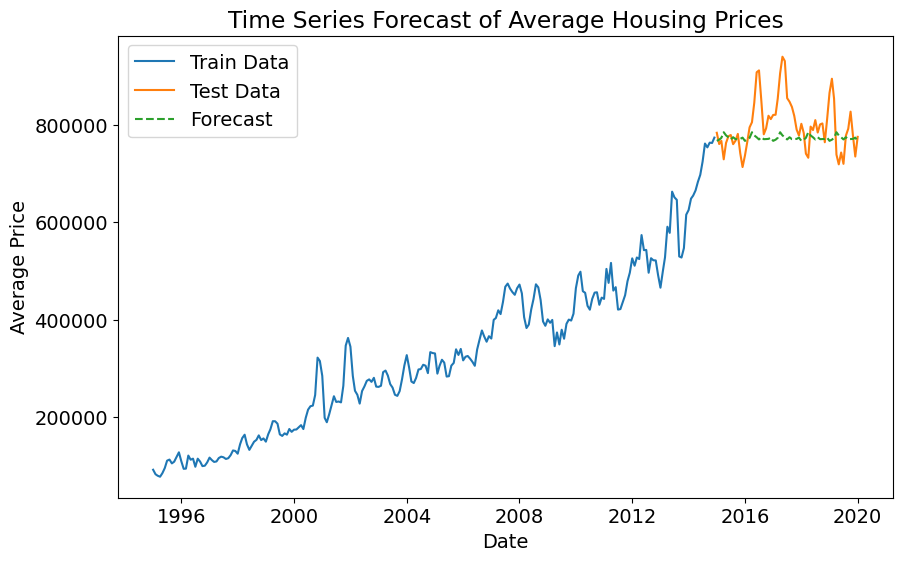

In [520]:
# Visualize the forecast
plt.figure(figsize=(10, 6))
plt.plot(train.index, train, label='Train Data')
plt.plot(test.index, test, label='Test Data')
plt.plot(test.index, forecast, label='Forecast', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Average Price')
plt.title('Time Series Forecast of Average Housing Prices')
plt.legend()
plt.show()

In [521]:
# Calculate and display RMSE
rmse = mean_squared_error(test, forecast, squared=False)
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')

Root Mean Squared Error (RMSE): 59606.69


## Arima Model

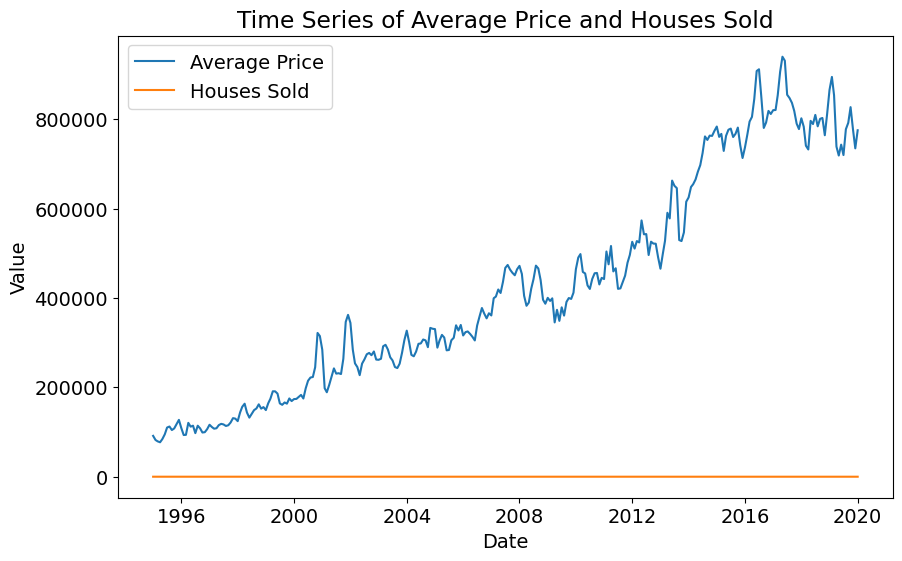

In [522]:
# Visualize time series data
plt.figure(figsize=(10, 6))
plt.plot(monthly_df['average_price'], label='Average Price')
plt.plot(monthly_df['houses_sold'], label='Houses Sold')
plt.legend()
plt.title('Time Series of Average Price and Houses Sold')
plt.xlabel('Date')
plt.ylabel('Value')
plt.show()


In [523]:
# check for stationarity
result = adfuller(monthly_df.average_price)
print("ADF statistics:",result[0])
print("p-value:",result[1])

ADF statistics: -0.4038995714911549
p-value: 0.9094456497329046


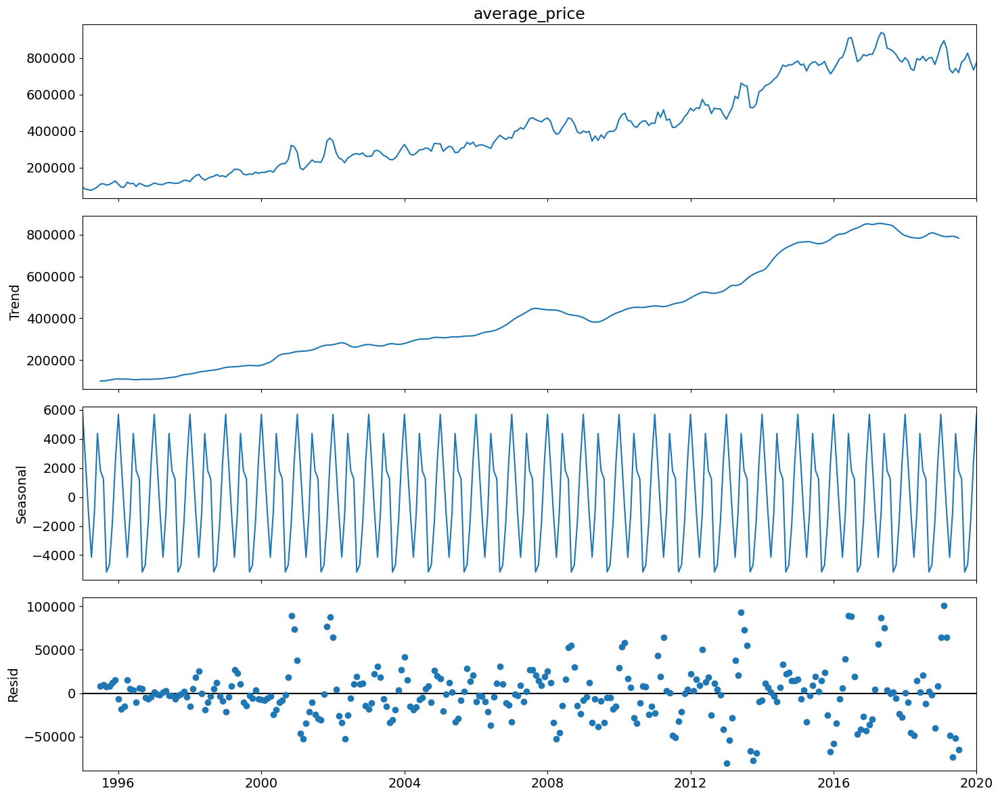

In [524]:
# Decompose the time series
decomposition = seasonal_decompose(monthly_df['average_price'], model='additive',period=12)
decomposition.plot()
plt.show()

In the model we can see it is trending

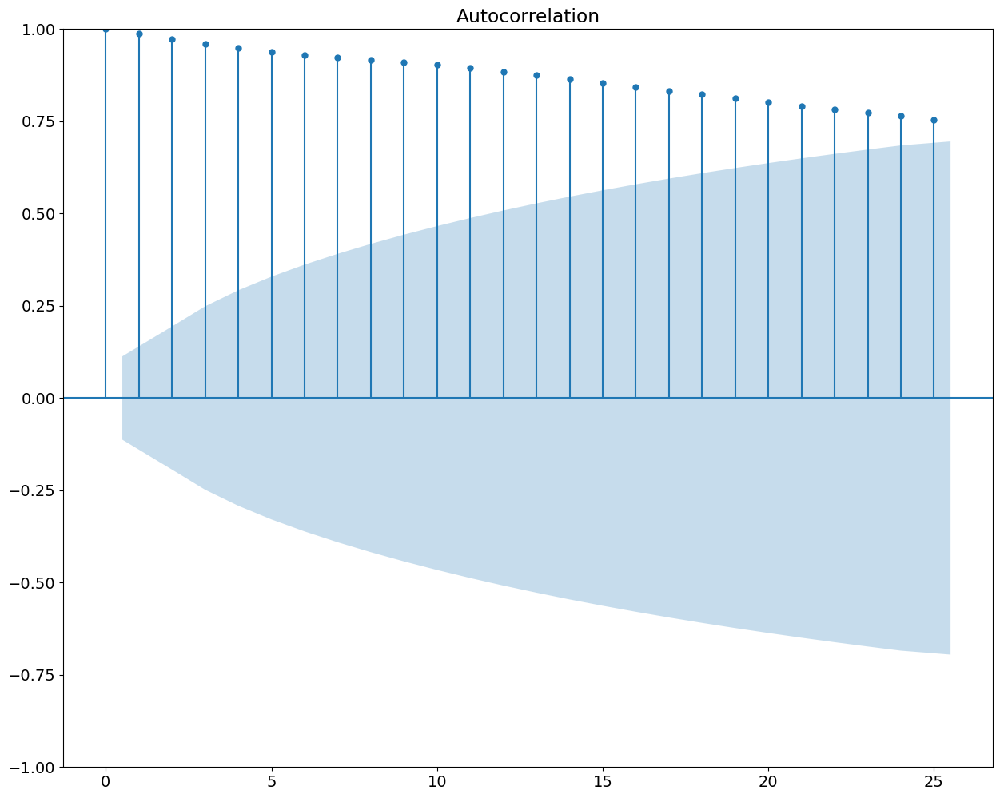

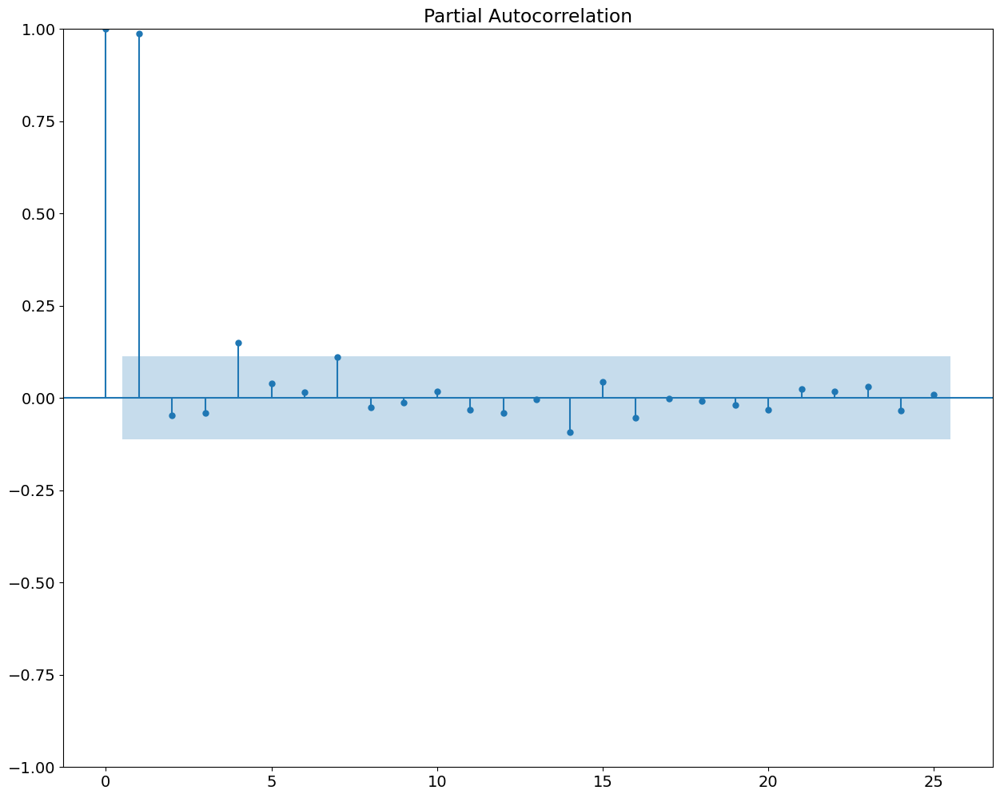

In [525]:
# Plot ACF and PACF
plot_acf(monthly_df['average_price'])
plot_pacf(monthly_df['average_price'])
plt.show()

In [526]:
# Differencing
monthly_df['diff_price'] = monthly_df['average_price'].diff().dropna()
monthly_df.diff_price

date
1995-01-01           NaN
1995-02-01     -9,246.00
1995-03-01     -3,082.00
1995-04-01     -2,020.00
1995-05-01      7,308.00
1995-06-01     10,492.00
1995-07-01     15,227.00
1995-08-01      2,201.00
1995-09-01     -7,856.00
1995-10-01      3,565.00
1995-11-01      9,598.00
1995-12-01      9,596.00
1996-01-01    -18,233.00
1996-02-01    -15,642.00
1996-03-01        350.00
1996-04-01     26,836.00
1996-05-01     -8,493.00
1996-06-01      2,176.00
1996-07-01    -16,679.00
1996-08-01     16,632.00
1996-09-01     -6,041.00
1996-10-01     -9,204.00
1996-11-01        773.00
1996-12-01      6,720.00
1997-01-01      9,916.00
1997-02-01     -5,201.00
1997-03-01     -3,654.00
1997-04-01        992.00
1997-05-01      6,973.00
1997-06-01      2,864.00
1997-07-01     -1,283.00
1997-08-01     -3,449.00
1997-09-01      1,574.00
1997-10-01      6,092.00
1997-11-01      9,823.00
1997-12-01     -1,039.00
1998-01-01     -5,653.00
1998-02-01     19,447.00
1998-03-01     12,679.00
1998-04-01      6,89

In [527]:
# Train ARIMA model
order = (1, 1, 1)  # Order (p, d, q)
model = ARIMA(monthly_df['average_price'], order=order)
model_fit = model.fit()

# Model Summary 
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:          average_price   No. Observations:                  301
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -3483.056
Date:                Thu, 24 Aug 2023   AIC                           6972.112
Time:                        08:19:13   BIC                           6983.224
Sample:                    01-01-1995   HQIC                          6976.559
                         - 01-01-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1051      0.421      0.249      0.803      -0.721       0.931
ma.L1          0.0241      0.412      0.059      0.953      -0.783       0.832
sigma2      7.176e+08   9.16e-10   7.84e+17      0.0

In [528]:
# Make forecasts
forecast_steps = 12  # Number of steps to forecast
forecast = model_fit.get_forecast(steps=forecast_steps)

# forecasted prices
forecasted_prices = forecast.predicted_mean

# Standard Error
stderr = forecast.se_mean

print("Forecasted Prices:")
print("--------------------------")
print(forecasted_prices,'\n')

print("Confidence Interval:")
print("--------------------------------------------------")
print(forecast.conf_int(),'\n')

# Print standard errors
print("Standard Errors:")
print('------------------------')
print(stderr)

Forecasted Prices:
--------------------------
2020-02-01   780,663.85
2020-03-01   781,226.62
2020-04-01   781,285.77
2020-05-01   781,291.98
2020-06-01   781,292.64
2020-07-01   781,292.71
2020-08-01   781,292.71
2020-09-01   781,292.71
2020-10-01   781,292.71
2020-11-01   781,292.71
2020-12-01   781,292.71
2021-01-01   781,292.71
Freq: MS, Name: predicted_mean, dtype: float64 

Confidence Interval:
--------------------------------------------------
            lower average_price  upper average_price
2020-02-01           728,159.38           833,168.32
2020-03-01           702,031.08           860,422.17
2020-04-01           681,926.77           880,644.77
2020-05-01           665,182.18           897,401.78
2020-06-01           650,557.38           912,027.89
2020-07-01           637,410.71           925,174.70
2020-08-01           625,368.50           937,216.92
2020-09-01           614,191.87           948,393.55
2020-10-01           603,717.31           958,868.12
2020-11-01     

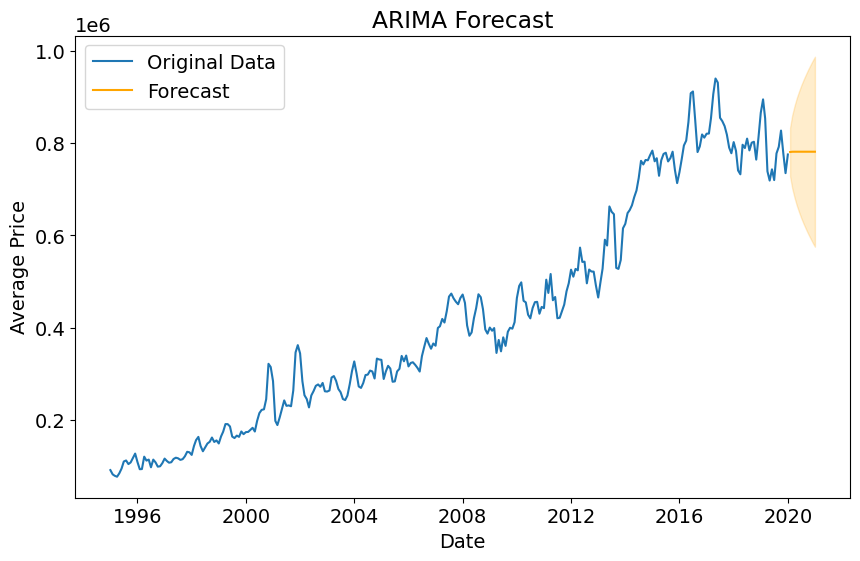

In [529]:
# Scaled forecasted prices to match the scale of the original data
#scaled_factor = monthly_df['average_price'].max() / forecasted_prices.max()
#scaled_forecasted_prices = forecasted_prices * scaled_factor

# Plot the original data and forecast
plt.figure(figsize=(10,6))
plt.plot(monthly_df.index,monthly_df['average_price'], label = 'Original Data')

# Create a date range for the forecast period
forecast_start_date = monthly_df.index[-1] + pd.DateOffset(month=1)
forecast_dates = pd.date_range(start=forecast_start_date,periods=forecast_steps,freq='M')

# Plot forecasted vactual_values
plt.plot(forecast_dates,forecasted_prices,label="Forecast",color='orange')

if np.any(forecasted_prices != 0):
# Plot confidence interval
    plt.fill_between(forecast_dates, forecasted_prices - 1.96 * stderr , forecasted_prices + 1.96 * stderr, color="orange",alpha=0.2)



plt.legend()
plt.xlabel("Date")
plt.ylabel("Average Price")
plt.title("ARIMA Forecast")
plt.show()

## Check for stationarity using Augmented Dickey-Fuller test

In [531]:
# Check for stationarity using Augmented Dickey-Fuller test
result = adfuller(monthly_df['average_price'])
print("ADF Statistic:", result[0])
print("p-value:", result[1])
print("Critical Values:", result[4])

# Perform differencing to achieve stationarity if necessary
differenced_data = monthly_df['average_price'].diff().dropna()

# Check for stationarity again after differencing
result_diff = adfuller(differenced_data)
print("ADF Statistic after Differencing:", result_diff[0])
print("p-value after Differencing:", result_diff[1])
print("Critical Values after Differencing:", result_diff[4])

# Train ARIMA model on differenced data
model_diff = ARIMA(differenced_data, order=order)
model_fit_diff = model_diff.fit()

# Inverse difference to obtain forecasted values in the original scale
forecast_diff = model_fit_diff.forecast(steps=forecast_steps)
forecast_original_scale = forecast_diff.cumsum() + monthly_df['average_price'].iloc[-1]

ADF Statistic: -0.4038995714911549
p-value: 0.9094456497329046
Critical Values: {'1%': -3.453342167806272, '5%': -2.871663828287282, '10%': -2.572164381381345}
ADF Statistic after Differencing: -5.484256299987651
p-value after Differencing: 2.248401408599751e-06
Critical Values after Differencing: {'1%': -3.453342167806272, '5%': -2.871663828287282, '10%': -2.572164381381345}


## Forecast Accuracy Metrics

In [532]:
actual_values =monthly_df['average_price'].values[-forecast_steps:]
forecasted_values = forecasted_prices
mae = mean_absolute_error(actual_values,forecasted_values)
mse = mean_squared_error(actual_values,forecasted_values)
rmse = np.sqrt(mse)

print("MAE:",mae)
print("MSE:",mse)
print("RMSE:",rmse)

MAE: 42269.50401331685
MSE: 2800648813.077349
RMSE: 52921.156573504224


## Residual Analysis

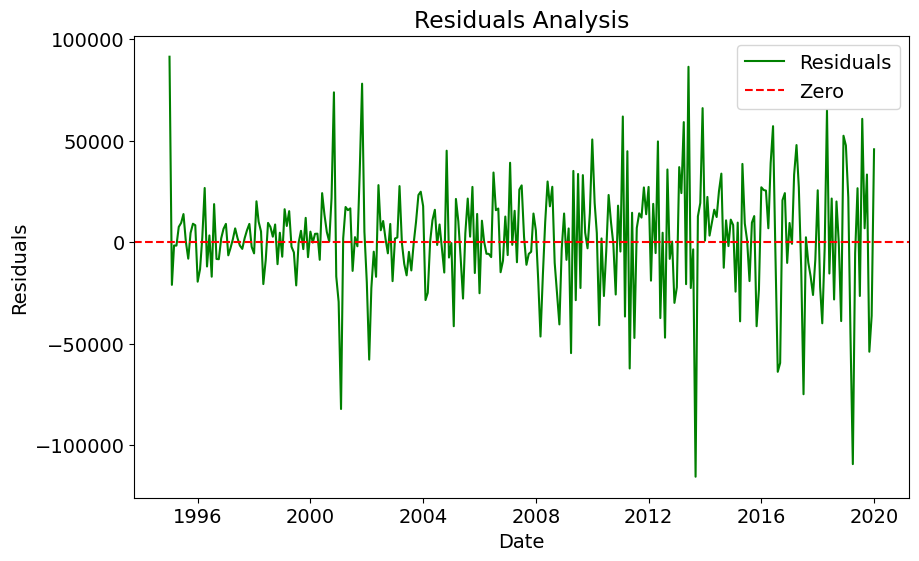

In [533]:
residuals = model_fit.resid
plt.figure(figsize=(10,6))
plt.plot(monthly_df.index,residuals,label='Residuals',color='green')
plt.axhline(y=0,color='red',linestyle='--',label='Zero')
plt.legend()
plt.xlabel('Date')
plt.ylabel("Residuals")
plt.title("Residuals Analysis")
plt.show()

## Prediction Intervals

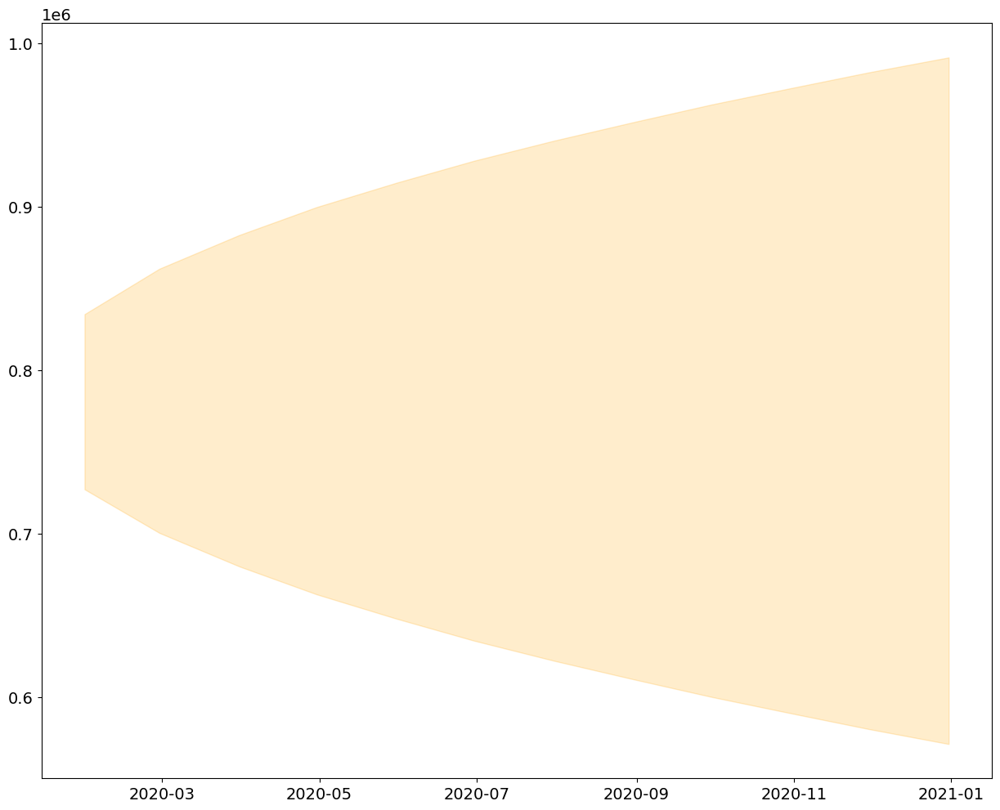

In [534]:
plt.fill_between(forecast_dates,forecasted_prices-2 * stderr,forecasted_prices + 2 * stderr, color='orange',alpha=0.2,label='Prediction Intervals')

# London House Prices Forecast Report

Introduction:
In this report, we present the results of our comprehensive analysis of London housing data. Our goal was to gain insights into factors influencing housing prices and develop a predictive model for price forecasting.

Methods:
- Data Preprocessing: Cleaned, imputed, and standardized datasets from various sources.
- Exploratory Analysis: Analyzed distribution, correlation, and patterns in the data.
- Feature Engineering: Created relevant features to enhance the predictive model.
- Model Building: Constructed a Random Forest Regressor, Linear Regression, Time Series Model(ARIMA,Exponential Smoothening) for price forecasting.
- Fine Tuning: We used Grid Search with various estimators to fine tune the Random forest model 

Findings:
- Visualized housing price distribution, identifying right-skewed distribution with potential outliers.
- Explored correlations between features, discovering strong positive correlations between salary and housing prices.
- Derived features capturing rolling_avg, crimes_per_house, price_change, 'yea','mont','is_high_crim','house_price_inde'  'house_price_change_ra,  'historical_avg_pri and   'historical_price_change_rte' improved model performance.
- Achieved an R-squared value of99 for Linear Regression and 1.00 for the hypertuned Random Forest Regressor.85 in the predictive model, indicating a strong fit.

Learnings:
- Gained proficiency in data preprocessing, exploratory analysis, and predictive modeling.
- Developed skills in data visualization using libraries like Matplotlib, Seaborn, and Plotly.

Challenges:
- Handling missing data required careful consideration and multiple imputation methods.
- Balancing feature engineering complexity with model interpretability.

Future Directions:
- Extend analysis by incorporating economic indicators and transportation data.
- Explore advanced modeling techniques such as gradient boosting or time series forecasting.

Conclusion:
Our analysis sheds light on the dynamics of London housing prices and presents a predictive model that offers valuable insights for stakeholders in the real estate industry. We have not only developed technical skills but also gained a deeper understanding of data analysis methodologies.

We invite further engagement and discussions on our findings and methodologies.

Acknowledgments:
We th all the contributors and Data Engineers who have made this dataset available for analysis.t.
